In [1]:
import sys
sys.path.append ('../../')
from pathlib import Path
import json
import pdb
import collections
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches, patheffects
import tqdm
import math
import random as rand
from PIL import Image
from collections import defaultdict
path = Path()
import pytesseract
from pytesseract import Output
pytesseract.pytesseract.tesseract_cmd = '/usr/local/Cellar/tesseract/4.1.1/bin/tesseract'
path = Path()

# Getting Scrapped Data

In [2]:
!ls 

COCOUIFilter-ColorDetection.ipynb annotations.csv
COCOUIFilter-Tesseract.ipynb      classes.csv
COCOUI_PROC_1.json                jpgs
CombiningScrappedData.ipynb       json
DataPipeline.ipynb                pre_data_filtered_annot.json
FilteringAnalysis.ipynb           processed_images
README.md                         val_annotations.csv
anchor_anno.csv


In [3]:
path

PosixPath('.')

In [4]:
!ls json

COCOUI3.json COCOUI4.json COCOUI5.json


In [5]:
pre_tot_annot = json.load((path/"json/COCOUI5.json").open())

In [6]:
len(pre_tot_annot)

35121

In [7]:
pre_tot_annot[0]

{'entities': {'11': {'coords': []},
  '10': {'coords': []},
  '13': {'coords': [{'right': 208.34375,
     'bottom': 710,
     'top': 678,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 665,
     'top': 617,
     'height': 48,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 604,
     'top': 556,
     'height': 48,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 543,
     'top': 511,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 498,
     'top': 466,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 453,
     'top': 373,
     'height': 80,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 360,
     'top': 296,
     'height': 64,
     'width': 181.5,
     'left': 26.84375}]},
  '12': {'coords': []},
  '15': {'coords

In [243]:
pre_tot_annot[0]['filename'].split(".")[0]

'0'

In [8]:
tot_annot = []
seen_ids = set()
for ann in pre_tot_annot:
    fname = "processed_images/" + "page_" + ann['filename'].split(".")[0] + ".jpeg"
    if ann['page_id'] in seen_ids:
        continue
    seen_ids.add(ann['page_id'])
    if os.path.exists(path/fname):
        ann['filename'] = fname.split("/")[1]
        tot_annot.append(ann)
len(tot_annot)

23105

In [9]:
with open('pre_data_filtered_annot.json', 'w') as f:
    json.dump(tot_annot, f)

In [10]:
!ls

COCOUIFilter-ColorDetection.ipynb annotations.csv
COCOUIFilter-Tesseract.ipynb      classes.csv
COCOUI_PROC_1.json                jpgs
CombiningScrappedData.ipynb       json
DataPipeline.ipynb                pre_data_filtered_annot.json
FilteringAnalysis.ipynb           processed_images
README.md                         val_annotations.csv
anchor_anno.csv


In [11]:
trn_fns = {page["page_id"]: "page_" + page["filename"].split(".")[0] + ".jpeg" for page in tot_annot}
len(trn_fns)

23105

In [12]:
trn_fns[0]

'page_page_0.jpeg'

In [13]:
!ls ../scraper/tutorial/resources
urls = json.load((path/"../scraper/tutorial/resources/all_new_urls_1.json").open())

all_new_urls_1.json


In [14]:
urls[100]

{'url': 'https://styleyourcake.de/produkt-kategorie/birthday/birthday-cookies/',
 '_type': 'dict',
 'keyword': 'birthday'}

In [15]:
jpgs = Path()/'processed_images'

In [16]:
cats = {1: "buttons", 2: "input", 3: "select", 4: "big heading", 
        5: "paragraphs", 6:"checkbox", 7: "above input", 8: "a", 9: "image", 10: "form",
       11: "legend", 12: "field", 13: "lists", 14: "list element", 15: "div", 16: "small heading",
       17: "button type", 18: "text type", 19: "input type", 20: "select type", 21: "input type", 22: "image type", 21: "checkbox type"}
preserve_cats = [3,4,2]
cats_to_super = {11: 2, 10:3}
super_cats = {1: "button type", 2:"text type", 3:"input type"}
banned_cats = [10, 12, 13, 15]
cats_reverse = {v: k for k,v in cats.items()}
used_cats = [str(k) for k in cats.keys()]
trn_fns = {page["page_id"]: page["filename"] for page in tot_annot}
classes = []

In [17]:
trn_fns[0]

'page_0.jpeg'

# Core Plotting Functions

In [18]:
def get_bb(coords): 
    try:
        ret = np.array([coords['top'], coords['left'], coords['bottom'], coords['right']])
    except:
        pdb.set_trace()
    return ret

In [19]:
def open_image(fn):
    flags = cv2.IMREAD_UNCHANGED+cv2.IMREAD_ANYDEPTH+cv2.IMREAD_ANYCOLOR
    im = cv2.imread(str(fn), flags).astype(np.float32)/255
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

In [20]:
def hw_bb(bb):
    return np.array([ bb[1], bb[0], bb[3] + bb[1] - 1, bb[2] + bb[0] - 1 ])

In [21]:
def show_img(im, figsize=None, ax=None):
    if not ax:
        fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    return ax

In [22]:
def draw_outline(o, lw):
    o.set_path_effects( [patheffects.Stroke(linewidth=lw, foreground='black'),
                          patheffects.Normal()] )

In [23]:
def draw_rect(ax, b, color='red'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

In [24]:
def draw_text(ax, xy, txt, sz=6, color='white'):
    text = ax.text(*xy, txt, verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [25]:
def bb_hw(a):
    return np.array( [ a[1], a[0], a[3] - a[1] + 1, a[2] - a[0] + 1 ] )

In [99]:
def draw_im(im, ann, cls=None, with_banned=False):
    # im is image, ann is annotations
    ax = show_img(im, figsize=(16, 8))
    for box in ann:
        if len(box) >= 5:
            b = box[:4]
            c = box[4]
        else:
            b = box[0]
            c = box[1]
        if not with_banned:
            if c in banned_cats: continue
        # b is bbox, c is class id
        b = bb_hw(b)
        if cls is None or c == cls:
            draw_rect(ax, b)
            draw_text(ax, b[:2], cats[c] + " " + str(box[5]), sz=6)

In [27]:
def draw_img(idx):
    show_img(open_image(jpgs / trn_fns[idx]), figsize=(8,16))

# Plotting Functions

In [28]:
def get_random_annotation_idx():
    idx = rand.randint(0,len(trn_annot_indexes))
    idx = trn_annot_indexes[idx]
    return idx

In [29]:
def draw_certain_class(cls, with_banned=False, with_filter=False):
    found = False
    while found is False:
        idx = get_random_annotation_idx()
        for el in trn_anno[idx]:
            if el[1] == cls:
                found = True
                break
    draw_idx(idx, cls=cls, with_filter=with_filter, with_banned=with_banned)
    return idx

In [30]:
PADDING = 10
def get_crop(idx, bb, see_results=True, padding=PADDING):
    img = open_image(jpgs / trn_fns[idx])
    
    if len(bb) == 2:
        bb = bb[0]

    im = img[max(0,int(bb[0])-padding):min(1024,padding+int(bb[2])), max(0,int(bb[1])-padding):min(1024,padding+int(bb[3]))]
    
    if see_results:
        ax = show_img(im)
    
        draw_rect(ax, bb_hw([0,0,bb[2]-bb[0]+2*padding, bb[3]-bb[1]+2*padding]))
    
    return im

In [31]:
def draw_idx(idx, ents=None, cls=None, with_filter=False, with_banned=False):
    if ents is None: 
        ents = trn_anno[idx] # training annotations
    
    if with_filter: 
        ents = filter_ents(idx, ents, cls)
        cls = None

    im = open_image(jpgs / trn_fns[idx]) # trn_fns is training image file names
    draw_im(im, ents, cls, with_banned) # im_a is an element of annotation

In [32]:
def draw_random_idx(with_filter=False):
    idx = get_random_annotation_idx()
    draw_idx(idx, with_filter=with_filter)
    return idx

In [33]:
def draw_before_after_random():
    idx = draw_random_idx(with_filter=False)
    print(idx)
    draw_idx(idx, with_filter=True)

# Bounding Box Processing

In [34]:
def process_ents(ents):
    new_ents = []
    for class_idx, coord_list in ents.items():
        if len(coord_list) <= 0: continue
        if len(coord_list['coords']) > 0:
            for coord in coord_list['coords']:
                bb = get_bb(coord)
                if bb[0] > 768 or bb[1] > 1024 or get_box_size(bb) <= 0: 
                    print("cls: {} box: {}, bs: {}".format(class_idx, bb, get_box_size(bb)))
                    continue
                new_ents.append((bb,int(class_idx)))
    return new_ents

In [35]:
def get_box_size(box):
    return (box[2]-box[0])*(box[3]-box[1])

In [36]:
def get_element_bounds(idx, cls=None):
    bounds = trn_anno[idx]
    
    if cls is None: return bounds
    
    ret = []
    
    for bo in bounds:
        if bo[1] == cls:
            ret.append(bo)
    
    return ret

In [37]:
def get_max_element_width(bounds):
    max_width = 0
    for en in ents.values():
        for coord in en['coords']:
            max_width = max(max_width, coord['right'])
    return max_width

In [38]:
def get_element_count(bounds):
    ent_count = defaultdict(int)
    
    for ent in bounds:
        ent_count[ent[1]] += 1
    
    return ent_count

# OCR

In [39]:
def show_detected_text(img):
    det = pytesseract.image_to_data(Image.open(img), output_type=Output.DICT)
    
    img = open_image(img)
    ax = show_img(img, figsize=(16, 8))
    
    n_boxes = len(det['level'])
    
    for i in range(n_boxes):
        (x, y, w, h) = (det['left'][i], det['top'][i], det['width'][i], det['height'][i])
        draw_rect(ax, np.array([x,y,w,h]))
        draw_text(ax, np.array([x,y-15]), det['text'][i], sz=9)

In [40]:
def detect_text(idx):
    im_pil = pil_from_idx(idx)
    return pytesseract.image_to_string(im_pil)

In [41]:
def get_text_info(img=None, idx=None):
    if idx is not None:
        img = open_image(jpgs / trn_fns[idx])
    img = np.uint8(img*255)
    im_pil = Image.fromarray(img)
    return pytesseract.image_to_data(im_pil, output_type=Output.DICT)

In [42]:
def get_text_on_bb(idx, bb, see_results=True):
    return get_text_info(img=get_crop(idx, bb, see_results))

In [43]:
def get_num_words(idx, bounds, see_results=False, return_words=False):
    info = get_text_on_bb(idx, bounds, see_results)
    wc = 0
    words = []
    for word in info['text']:
        if word != "": 
            wc += 1
            words.append(word)
            if see_results: print(word)  
    
    if return_words:
        return wc, words
    else:
        return wc

In [44]:
def get_rand_crop_words(idx, bounds):
    return get_num_words(idx, bounds[rand.randint(0, len(bounds)-1)])

# OpenCV

In [45]:
def opencv_to_pil(im):
    img = np.uint8(im*255)
    im_pil = Image.fromarray(img)
    return im_pil

In [46]:
def open_pil(path):
    return opencv_to_pil(open_image(path))

In [47]:
def pil_from_idx(idx):
    return opencv_to_pil(open_image(jpgs / trn_fns[idx]))

In [48]:
def get_colors_of_bb(idx, bb, see_results=True):
    crop_image = get_crop(idx, bb, see_results, padding=0)
    pim = opencv_to_pil(crop_image)
    colors = pim.getcolors(pim.size[0]*pim.size[1])
    colors.sort(key=lambda x: x[0], reverse=True)

    return colors

In [49]:
def get_rand_bb_colors(idx, cls=None):
    bounds = get_element_bounds(idx, cls)
    return get_colors_of_bb(idx, bounds[rand.randint(0, len(bounds)-1)])

# Data Filtering Pipeline

In [50]:
preserve_cats

[3, 4, 2]

In [51]:
def filter_ents(idx, ents, cls=None):
    "Master class to run annotations through, does general processing and calls specific functions for each element"
    filtered_ents = []
    
    for ent in ents:
        if cls is not None:
            if ent[1] != cls: continue
        
        colors = get_colors_of_bb(idx, ent, False)
        color_sum = 0
        for col in colors:
            color_sum += col[0]
        #print("{} {} {}".format(ent[1], len(colors), colors[0][0] / color_sum))
        
        if ent[1] not in preserve_cats:
            if len(colors) < 2: continue
            if colors[0][0] / color_sum >= 0.98: continue
        
        size = get_box_size(ent[0])
        
        if size > 500000: continue
        
        if ent[1] == cats_reverse['list element']:
            filt = filter_li_bound(idx, ent)
            
            if len(filt) > 0:
                filtered_ents.append(filt)
                
        elif ent[1] == cats_reverse["a"]:
            filt = filter_a_bound(idx,ent)
            
            if len(filt) > 0:
                filtered_ents.append(filt)
        
        elif ent[1] == cats_reverse["above input"]:
            filt = filter_above_input_bound(idx, ent)
            
            if len(filt) > 0:
                filtered_ents.append(filt)
                
        elif ent[1] == cats_reverse['select']:
            filtered_ents.append(filter_select(idx, ent))
            
        elif ent[1] == cats_reverse['input']:
            filt = filter_input(idx, ent)
            
            if len(filt) > 0:
                filtered_ents.append(filt)
        
        elif ent[1] == cats_reverse['big heading'] or ent[1] == cats_reverse['small heading'] or ent[1] == cats_reverse['paragraphs']:
            filt = filter_text(idx, ent)
            
            if len(filt) > 0:
                filtered_ents.append(filt)
        
        elif ent[1] == cats_reverse['checkbox']:
            filtered_ents.append([ent[0][0], ent[0][1], ent[0][2], ent[0][3], cats_reverse['checkbox type']])
        
        elif ent[1] == cats_reverse['image']:
            filtered_ents.append([ent[0][0], ent[0][1], ent[0][2], ent[0][3], cats_reverse['image type']])
                
        elif ent[1] in banned_cats:
            continue
        
        elif ent[1] == cats_reverse['buttons']:

            filtered_ents.append(filter_button(idx,ent))
            
        else:
            filtered_ents.append([ent[0][0], ent[0][1], ent[0][2], ent[0][3], ent[1]])

    filtered_ents = filter_filtered(idx, filtered_ents)
    #for ento in filtered_ents:
       # print(ento)
    #print("------")

    final_values = post_filter(idx, filtered_ents)
    #print(final_values)

    return final_values

In [52]:
def filter_filtered(idx, ents):

    filtered_ents = []
    
    for ent in ents:
        if ent[4] == cats_reverse['text type']:
            filtered_ents.append(tighten_text_bb(idx, ent))
        else:
            filtered_ents.append(ent)
    
    return filtered_ents

In [53]:
def vert_overlap(bb1, bb2):
    return not (bb1[2] < bb2[0] or bb2[2] < bb1[1])

def hor_overlap(bb1, bb2):
    return not (bb1[3] < bb2[1] or bb2[3] < bb1[1])
    
def bb_overlap(bb1, bb2):
    return vert_overlap(bb1, bb2) and hor_overlap(bb1, bb2)

In [87]:
def get_bb_no_cls(ent):
    return ent[:-1]

def post_filter(idx, ents):
    filtered_ents = []
    
    for eid, ent in enumerate(ents):
        
        if ent[4] == cats_reverse['image type']:
            
            overlap = False
            for e2id, e2 in enumerate(ents):
                if e2id != eid:
                    if bb_overlap(get_bb_no_cls(ent), get_bb_no_cls(e2)):
                        overlap = True
                        break
                        
            if not overlap:
                filtered_ents.extend(post_image_filter(idx, ent))
            else:
                filtered_ents.append(ent)
        
        else:
            filtered_ents.append(ent)
    
    filtered_ents = filter_phantom_dropdowns(ents)
    
    return non_max_suppression_fast(filtered_ents, 0.01)

In [95]:
def rel_vert_overlap(e1, e2):
    vert_overlap = min(e1[3], e2[3]) - max(e1[1], e2[1])
    
    return vert_overlap / (max(e1[3]-e1[1], e2[3]-e2[1]))
    
    
def filter_phantom_dropdowns(ents):
    button_ents = []
    filtered_ents = []
    
    for ent in ents:
        if ent[4] == cats_reverse['button type']:
            if len(ent) > 5 and ent[5] == 0:
                button_ents.append(ent)
            else:
                filtered_ents.append(ent)

    for e1 in button_ents:
        num_over = 0
        for e2 in button_ents:
            if (e1 == e2): continue
            vo = vert_overlap(e1, e1)
            
            if vo > 0.8: num_over += 1
        
        if num_over <= 2:
            filtered_ents.append(e1)
    
    return filtered_ents
    

In [101]:
draw_idx(29610, with_filter=True)

KeyError: 29610

/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:170: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


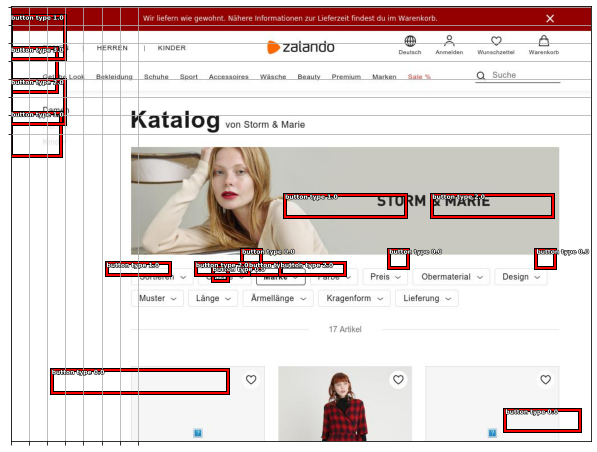

In [100]:
draw_idx(35890, with_filter=True)

In [83]:
no_combine = [cats_reverse['button type'], cats_reverse['input type'], cats_reverse['select type'], cats_reverse['checkbox type']]
prior = {cats_reverse['button type']: 5, cats_reverse['text type']: 5, cats_reverse['input type']: 6,
         cats_reverse['select type']: 6, cats_reverse['image type']: 1, cats_reverse['checkbox type']: 7}

def overlap(b1, b2):
    return max(0,min(b1[2], b2[2])-max(b1[0], b2[0]))*max(0,min(b1[3], b2[3])-max(b1[1], b2[1])) / ((b1[3]-b1[1])*(b1[2]-b1[0]))
    
    
def solveOverlap(idxs, boxes):
    if len(idxs) == 1:
        boxes = boxes[0]
        return [[boxes[0]], [boxes[1]], [boxes[2]], [boxes[3]], [boxes[4]], [boxes.tolist()]], idxs

    classes = defaultdict(list)
    cls_boxes = []
    
    for box in boxes:
        classes[box[4]].append(box)
    
    newx1, newx2, newy1, newy2, newcls = [],[],[],[],[]
    
    for cls, box in classes.items():
        if cls in no_combine:
            for bo in box:
                include = True
                for obo in box:
                    if (bo == obo).all(): continue
                    else:
                        if overlap(bo, obo) > 0.95:
                            include = False
                            break
                if include: cls_boxes.append(bo)
        else:
                
            minx, miny, maxx, maxy, wc = math.inf, math.inf, -math.inf, -math.inf, 0

            for bo in box:
                miny = min(bo[0], miny)
                minx = min(bo[1], minx)
                maxx = max(bo[3], maxx)
                maxy = max(bo[2], maxy)
                wc = wc + bo[5]
                """
                if minx == math.inf or bb_overlap(bo, [miny-5,minx-5,maxy+5,maxx+5]):
                    miny = min(bo[0], miny)
                    minx = min(bo[1], minx)
                    maxx = max(bo[3], maxx)
                    maxy = max(bo[2], maxy)
                else:
                    cls_boxes.append(bo)
                """

            cls_boxes.append([miny, minx, maxy, maxx, cls, wc])
    
    ret_boxes = []

    for box in cls_boxes:
        remove_box = False
        for obox in cls_boxes:
            if box[4] == obox[4]: continue
            
            #print("CURR BOX: {}, NEW BOX: {}".format(get_box_size(box), get_box_size(obox)))
            try:
                if prior[box[4]] > prior[obox[4]]: 
                    continue
                elif prior[box[4]] < prior[obox[4]]:
                    remove_box = True
                    break
                else:
                    if get_box_size(box) < get_box_size(obox):
                        remove_box = True
            except:
                pdb.set_trace()
                    
        if not remove_box:
            ret_boxes.append(box)
            newx1.append(box[1])
            newx2.append(box[3])
            newy1.append(box[0])
            newy2.append(box[2])
            newcls.append(box[4])
            
    #pdb.set_trace()
    return [newx1, newx2, newy1, newy2, newcls, ret_boxes], idxs
    
    
def non_max_suppression_fast(boxes, overlapThresh):
    # if there are no boxes, return an empty list
    if len(boxes) == 0:
        return []
    for box in boxes:
        if len(box) == 5:
            box.append(0)
    boxes = np.array(boxes)
    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
    # initialize the list of picked indexes	abs
    pick = []
    # grab the coordinates of the bounding boxes

    x1 = boxes[:,1]
    y1 = boxes[:,0]
    x2 = boxes[:,3]
    y2 = boxes[:,2]
    cls = boxes[:,4]
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    num_orig_boxes = len(x1)
    
    new_idx_num = len(x1)
    
    new_idxs = []
    
    #pdb.set_trace()
    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        
        if len(new_idxs) > 0:
            used_idxs = np.append(idxs,new_idxs).astype("int")
        else: 
            used_idxs = idxs.astype("int")
        #pick.append(i)
        # find the largest (x, y) coordinates for the start of
        # the bounding box and the smallest (x, y) coordinates
        # for the end of the bounding box
        xx1 = np.maximum(x1[i], x1[used_idxs])-5
        yy1 = np.maximum(y1[i], y1[used_idxs])-5
        xx2 = np.minimum(x2[i], x2[used_idxs])+5
        yy2 = np.minimum(y2[i], y2[used_idxs])+5
        # compute the width and height of the bounding box
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / area[used_idxs]
        overlap[last] = 0
        
        picks,delete = solveOverlap(np.concatenate(([last], np.where(overlap > 0)[0]), 0), np.concatenate(([boxes[used_idxs[last]]], boxes[used_idxs[np.where(overlap > 0)[0]]])))
        # delete all indexes from the index list that hav
        #print("PICK: {}, DEL: {}, PICKS: {}, IDXS: {}".format(picks, delete, pick, idxs))
        #pick.extend(picks)
        try:
            new_idxs = np.append(new_idxs, [n for n in range(new_idx_num, len(picks[0])+new_idx_num)])
            x1 = np.append(x1, picks[0])
            x2 = np.append(x2, picks[1])
            y1 = np.append(y1, picks[2])
            y2 = np.append(y2, picks[3])
            cls = np.append(cls, picks[4])
        except:
            pdb.set_trace()
        boxes = np.concatenate((boxes, np.array(picks[5])), 0)
        area = (x2 - x1 + 1) * (y2 - y1 + 1)
        new_idx_num += len(picks[0])
        
        new_idxs_delete = []
        for del_id in delete:
            del_id = del_id - len(idxs)
            if del_id > 0:
                new_idxs_delete.append(del_id)
        new_idxs = np.delete(new_idxs, new_idxs_delete)
        
        idxs = np.delete(idxs, delete)

    return boxes[new_idxs.astype("int")]

In [89]:
def filter_li_bound(idx, li_bound):
    num_words = get_num_words(idx, li_bound, see_results=False)
    
    if num_words < 3:
        return [li_bound[0][0], li_bound[0][1], li_bound[0][2], li_bound[0][3], cats_reverse["button type"], num_words]
    else:
        return [li_bound[0][0], li_bound[0][1], li_bound[0][2], li_bound[0][3], cats_reverse["text type"]]

def draw_list_element_with_filter(idx):
    return draw_idx(idx, cls=cats_reverse["list element"], with_filter=True)

def draw_random_list_elements():
    return draw_certain_class(cats_reverse['list element'])

# If too small discard (300), else if search keyword found then label as element, else text
def filter_above_input_bound(idx, ai_bound):
    size = get_box_size(ai_bound[0])
    
    if size < 500:
        return []
    
    wc,words = get_num_words(idx, ai_bound, see_results=False, return_words=True)
    
    if "Search" in words or "search" in words or "http" in words:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["input type"]]
    else:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["text type"]]
    
    num_words = get_num_words(idx, ai_bound, see_results=False)

def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"], num_words]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound
    
def filter_button(idx, b_bound):
    return [b_bound[0][0], b_bound[0][1], b_bound[0][2], b_bound[0][3], cats_reverse['button type']]

def filter_select(idx, s_bound):
    return [s_bound[0][0], s_bound[0][1], s_bound[0][2], s_bound[0][3], cats_reverse['select type']]

# Opening Scrapped Data

In [60]:
tot_annot[0]

{'entities': {'11': {'coords': []},
  '10': {'coords': []},
  '13': {'coords': [{'right': 208.34375,
     'bottom': 710,
     'top': 678,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 665,
     'top': 617,
     'height': 48,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 604,
     'top': 556,
     'height': 48,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 543,
     'top': 511,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 498,
     'top': 466,
     'height': 32,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 453,
     'top': 373,
     'height': 80,
     'width': 181.5,
     'left': 26.84375},
    {'right': 208.34375,
     'bottom': 360,
     'top': 296,
     'height': 64,
     'width': 181.5,
     'left': 26.84375}]},
  '12': {'coords': []},
  '15': {'coords

In [63]:
trn_anno = collections.defaultdict(lambda:[])
seen_page_ids = set()
for i,img_annotations in (enumerate(tot_annot)):
    if img_annotations['page_id'] in seen_page_ids: continue
    seen_page_ids.add(img_annotations['page_id'])
    for class_idx,coord_list in img_annotations['entities'].items():
        if len(coord_list) <= 0: continue
        if len(coord_list['coords']) > 0:
            for coord in coord_list['coords']:
                if type(coord) != dict: continue
                bb = get_bb(coord)
                if bb[0] > 768 or bb[1] > 1024 or get_box_size(bb) <= 0: 
                    continue
                tampered = False
                if bb[0] < 0: 
                    tampered = True
                    bb[0] = 0
                if bb[1] < 0:
                    tampered = True
                    bb[1] = 0
                if bb[2] < 0: 
                    tampered = True
                    bb[2] = 0
                if bb[3] < 0: 
                    tampered = True
                    bb[3] = 0
                if bb[2] > 768: 
                    tampered = True
                    bb[2] = 1024
                if bb[3] > 1024: 
                    tampered = True
                    bb[3] = 768
                if tampered == True: continue
                trn_anno[img_annotations['page_id']].append((bb,int(class_idx)))
trn_annot_indexes = [i for i in trn_anno.keys()]

In [62]:
#Pre processed images
trn_anno = collections.defaultdict(lambda:[])
seen_page_ids = set()
for i,img_annotations in (enumerate(tot_annot)):
    if img_annotations['page_id'] in seen_page_ids: continue
    seen_page_ids.add(img_annotations['page_id'])
    trn_anno[img_annotations['page_id']] = [[box[:4], box[4]] for box in img_annotations['entities']]
trn_annot_indexes = [i for i in trn_anno.keys()]

IndexError: string index out of range

# Analysis

In [64]:
len(trn_annot_indexes)

20786

In [ ]:
cls_dist = {int(a): 0 for a in cats.keys()}
size_dist = {i*1000: 0 for i in range(51)}
num_elements = {i*10: 0 for i in range(51)}

In [ ]:
tot_ent = 0
min_anno = 100
max_anno = 0
for key, anno in trn_anno.items():
    num_el = round(len(anno)/10)*10
    num_elements[min(500, num_el)] += 1
    tot_ent += len(anno)
    max_anno = max(max_anno, len(anno))
    min_anno = min(min_anno, len(anno))
    
    for el in anno:
        el_size = get_box_size(el[0])
        if el_size > 786432 or el_size < 0: pdb.set_trace()
        size_dist[min(50000,round(el_size/1000)*1000)] += 1
        cls_dist[el[1]] += 1
    
tot_ent/len(trn_anno), max_anno, min_anno

In [ ]:
keys = [cats[id] for id in cls_dist.keys()]
values = cls_dist.values()
plt.xticks(rotation='vertical')
plt.bar(keys, values)
cls_dist[cats_reverse['legend']]

In [ ]:
keys = [k/1000 for k in size_dist.keys()]
values = size_dist.values()
plt.bar(keys, values)

# Before/Afters

In [90]:
draw_idx(35890, with_filter=True)

AttributeError: 'bool' object has no attribute 'all'

In [66]:
urls[35890]

{'url': 'https://www.zalando.ch/storm-marie/',
 '_type': 'dict',
 'keyword': 'storm'}

35890


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


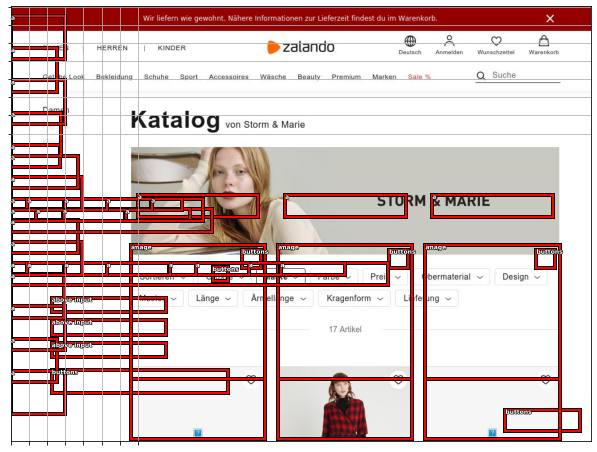

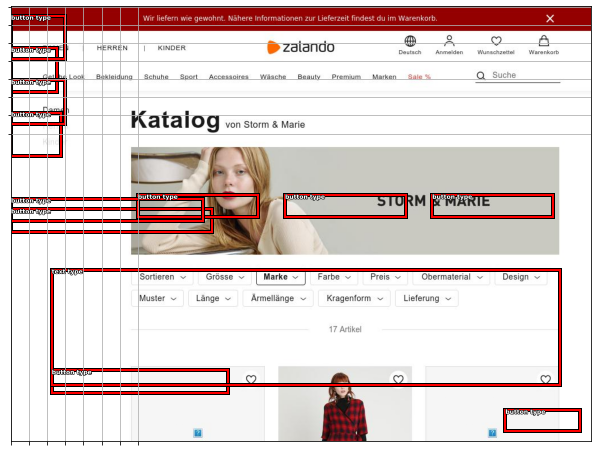

In [65]:
draw_before_after_random()

# Image

In [268]:
def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
    

In [ ]:
draw_idx(40242, with_filter=False)

In [ ]:
get_text_on_bb(40242, [get_element_bounds(40242, cats_reverse['big heading'])[0][0]])

In [ ]:
draw_idx(40242, with_filter=True)

In [ ]:
idx = draw_certain_class(cats_reverse["image"], with_filter=False)
idx

In [ ]:
urls[9319]

In [ ]:
draw_idx(12437)

# A 

In [255]:
def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]

26225

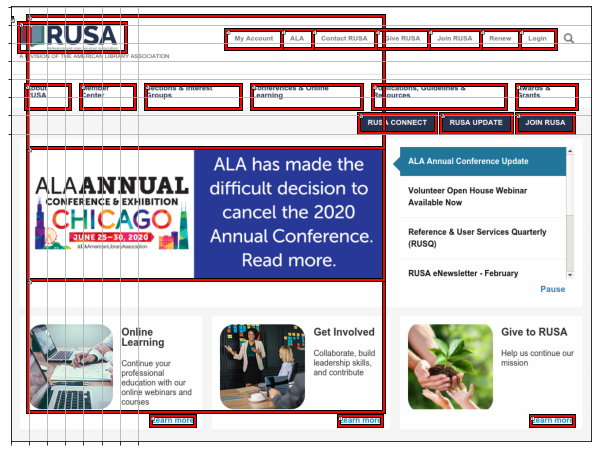

In [712]:
draw_certain_class(cats_reverse["a"])

In [718]:
for el in get_element_bounds(26225, cls=cats_reverse['a']):
    print(get_box_size(el[0]))

1218.75
1218.75
1218.75
146091
146091
146091
3323.203125
4084.265625
4441.59375
4313.96875
9574.78125
7948.875
6855.328125
3870.015625
3189.671875
2004.5
2197.0
2942.5
2985.5
3581.5
1748.5
3134.5
9588
1


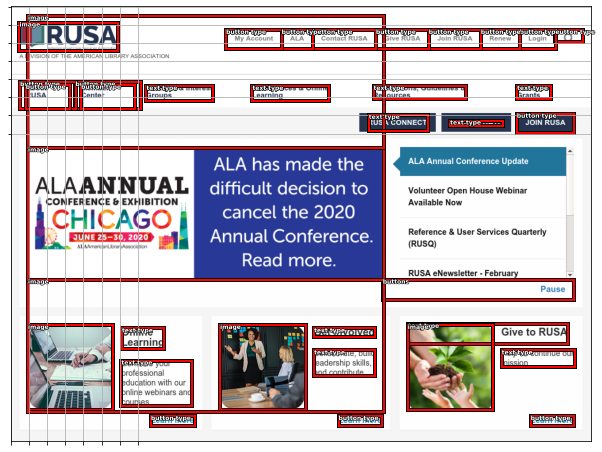

In [857]:
draw_idx(26225, with_filter=True, with_banned=False)

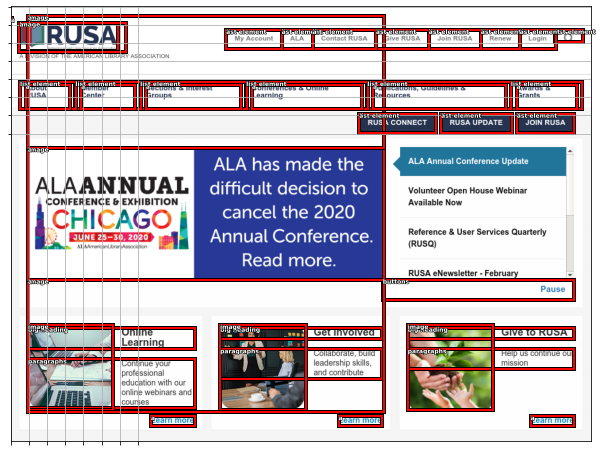

In [724]:
draw_idx(26225)

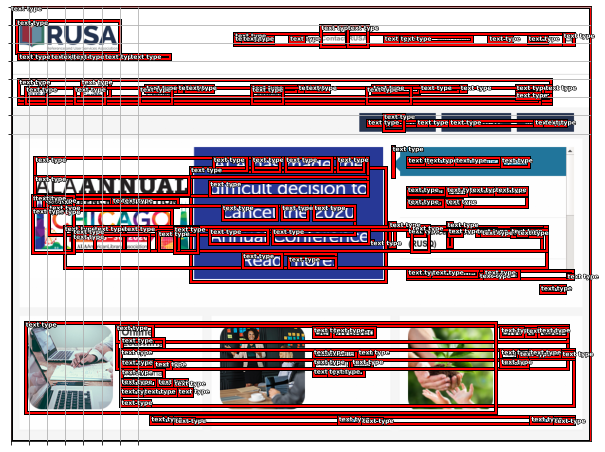

In [763]:
draw_text_bb(idx)

# Checkbox

1046

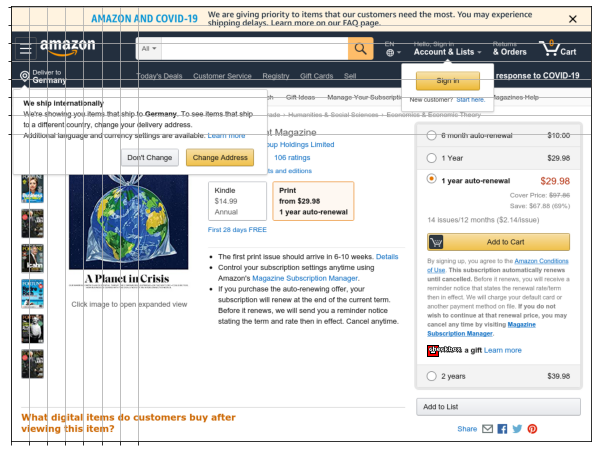

In [701]:
draw_certain_class(cats_reverse["checkbox"])

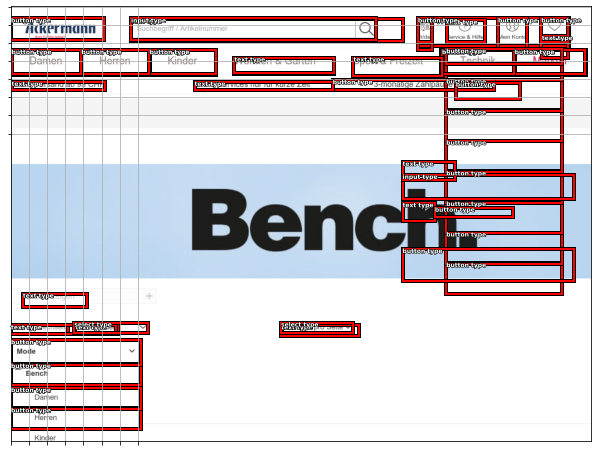

In [688]:
draw_idx(32327, with_filter=True)

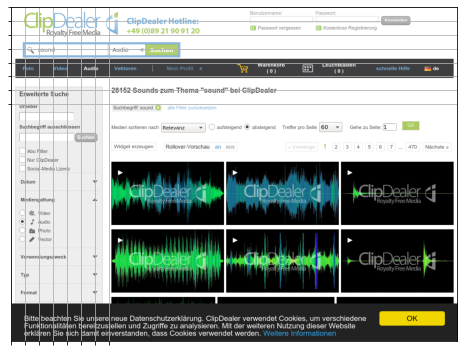

In [692]:
draw_img(11944)

# Div

In [256]:
def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []

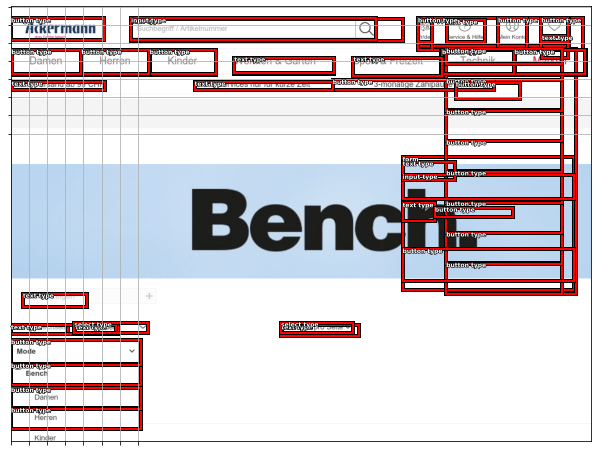

In [684]:
draw_idx(32327, with_filter=True, with_banned=True)

32327

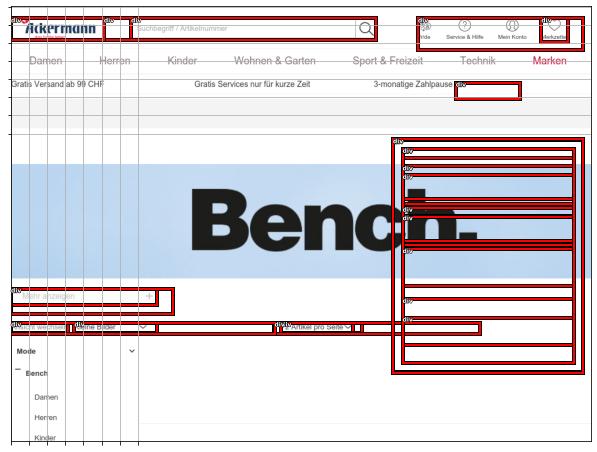

In [682]:
draw_certain_class(cats_reverse["div"], with_banned=True)

# Tighter Text Bounds

In [89]:
def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound

In [263]:
def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound

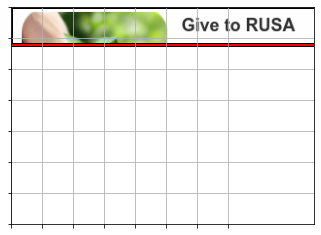

In [802]:
_ = get_crop(idx, get_element_bounds(idx, cats_reverse['big heading'])[0])

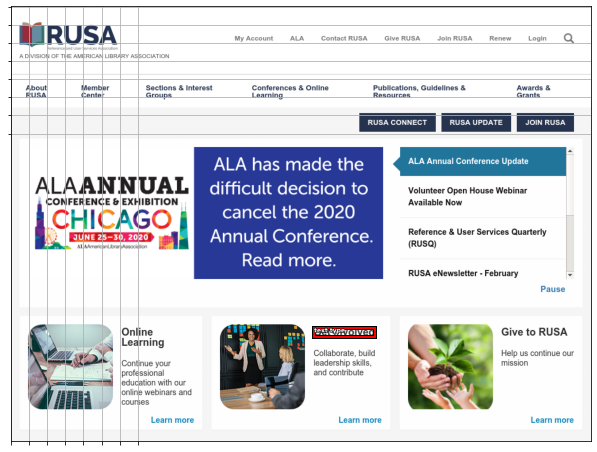

In [856]:
draw_idx(idx, ents=[tighten_text_bb(idx, get_element_bounds(idx, cats_reverse['big heading'])[1])])

In [ ]:
draw_idx(idx, with_filter=True)

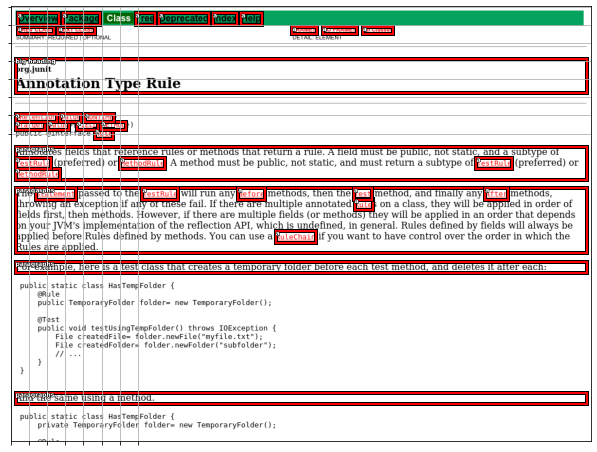

In [674]:
draw_idx(idx)

In [730]:
idx = 26225

In [731]:
info = get_text_info(idx=26225)
info.keys()

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])

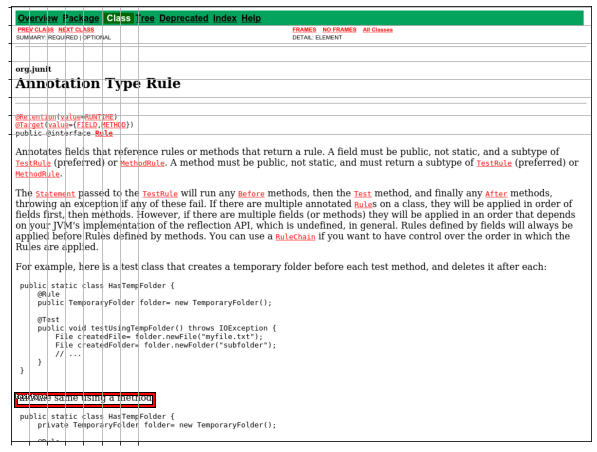

In [671]:
draw_idx(idx, ents=[tighten_text_bb(idx, get_element_bounds(idx, cats_reverse['paragraphs'])[0])])

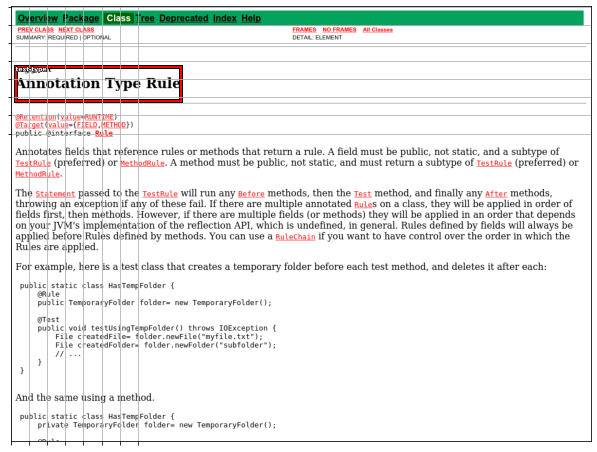

In [656]:
draw_idx(idx, ents=[tighten_text_bb(idx, get_element_bounds(idx, cats_reverse['big heading'])[0])])

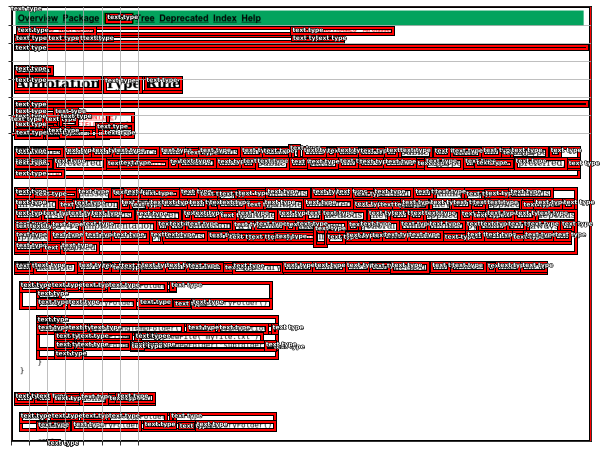

In [641]:
draw_text_bb(idx)

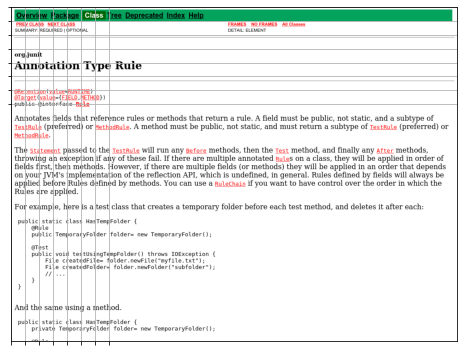

In [643]:
draw_img(idx)

In [629]:
get_element_bounds(idx, cats_reverse['paragraphs'])[0]

(array([ 681.8125,    8.    ,  700.8125, 1016.    ]), 5)

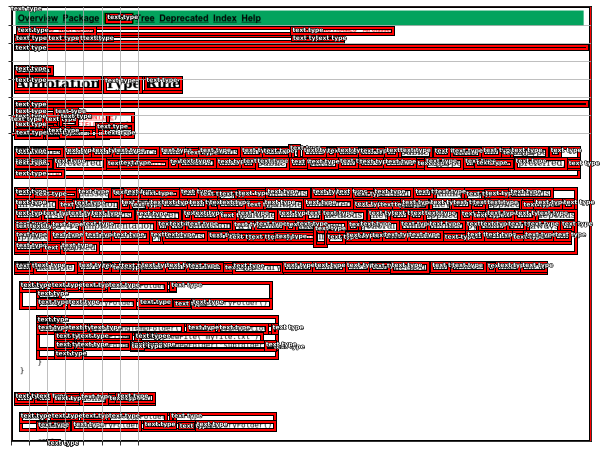

In [620]:
draw_text_bb(idx)

# Big Heading

In [257]:
def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound

In [ ]:
get_text_info()

In [597]:
draw_idx(idx, with_filter=True)

KeyError: None

{'url': 'https://junit.org/junit4/javadoc/4.12/org/junit/Rule.html',
 '_type': 'dict',
 'keyword': 'rule'}

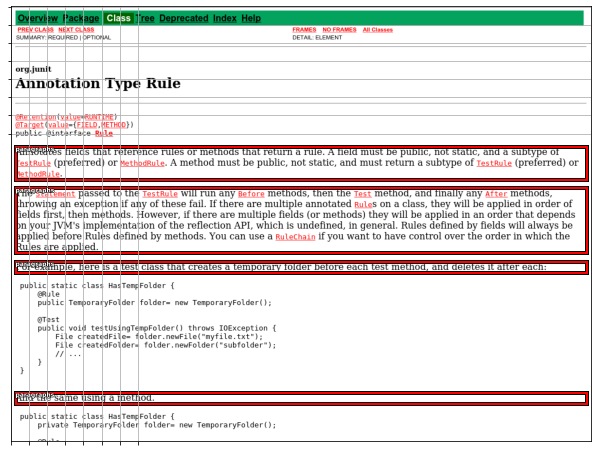

In [603]:
idx = draw_certain_class(cats_reverse['paragraphs'])
urls[idx]

959 0.4257461118116856
2 0.9986088379705401
133 0.7382953181272509
435 0.7178403755868544
262 0.7275995575221239
543 0.7748898891631576
133 0.7528344671201814
122 0.771689497716895
427 0.671875
575 0.7202957991548595
129 0.7454153182308522
144 0.7100283822138127
159 0.6732954545454546
542 0.7627434135166093
129 0.7454153182308522
125 0.6723856209150327
594 0.5421927609427609
173 0.6797129810828441
675 0.6523738503604275
132 0.7429577464788732
188 0.8492178098676294
188 0.7823620996441281
763 0.7231767850324551
132 0.7429577464788732
131 0.6430260047281324
258 0.7198946886446886
85 0.6976744186046512
571 0.7064379816057669
1161 0.7877555150779194
13 0.8988095238095238
1384 0.6847850183769908
120 0.7363057324840764
119 0.9209257473481196
134 0.7269534679543459
134 0.8076685219542362
134 0.7115027829313544
134 0.7115027829313544
134 0.7115027829313544
134 0.7115027829313544
387 0.8884679295446992
246 0.939016393442623
167 0.7400145243282498
169 0.7383568812140241
85 0.5256055363321799
112

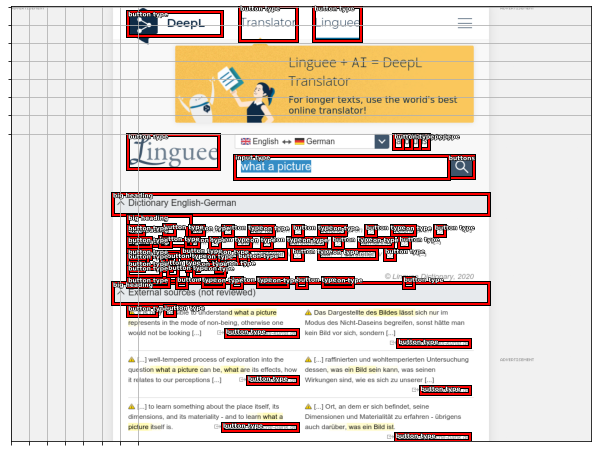

In [448]:
draw_idx(idx, with_filter=True)

In [460]:
bdx = 0
bound = [get_element_bounds(idx, cls=cats_reverse['small heading'])[bdx][0]]

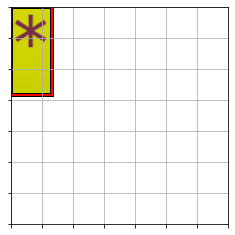

In [461]:
wc,words = get_num_words(idx, bound, see_results=True, return_words=True)

In [463]:
words

[]

# Button

In [258]:
def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound
    
def filter_button(idx, b_bound):
    return [b_bound[0][0], b_bound[0][1], b_bound[0][2], b_bound[0][3], cats_reverse['button type']]

{'url': 'https://www.nbcnews.com/business/business-news/small-business-owners-stuck-loan-limbo-new-government-programs-stumble-n1177901',
 '_type': 'dict',
 'keyword': 'loan'}

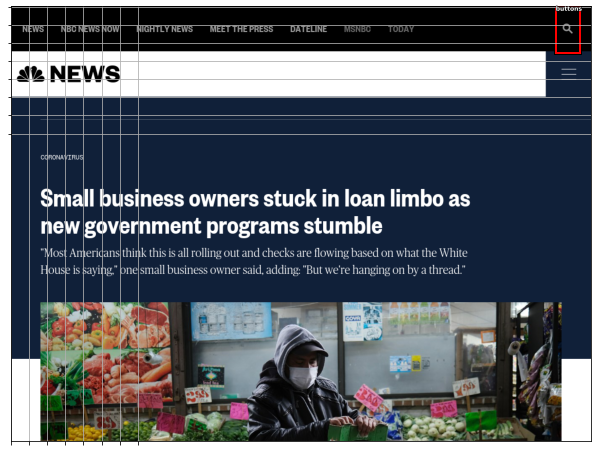

In [421]:
idx = draw_certain_class(cats_reverse['buttons'])
urls[idx]

In [411]:
idx

13098

5

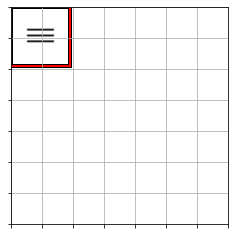

In [403]:
len(get_colors_of_bb(idx, [get_element_bounds(idx, cls=cats_reverse['buttons'])[0][0]]))

# Input

In [259]:
def filter_input(idx, i_bound):
    num_colors = len(get_colors_of_bb(idx, i_bound, see_results=False))
    
    if num_colors < 1000:
        return [i_bound[0][0], i_bound[0][1], i_bound[0][2], i_bound[0][3], cats_reverse['input type']]
    else:
        return []

231 0.8495238095238096
244 0.9424962292609351
258 0.8181290790427846
687 0.8233329403905851
254 0.8567060248259158
255 0.8743742475128319
261 0.9109628385842429
261 0.9109628385842429
255 0.884835154326153
405 0.9059288926824464
411 0.9281361501771767
411 0.9281361501771767
411 0.9281361501771767
411 0.9281361501771767
418 0.3783749570501112
679 0.5613716120022851
679 0.6104439955608428
679 0.6613441703569
484 0.7583023594053006
484 0.7871905236198065
484 0.7871905236198065
229 0.7619512195121951
323 0.6605042016806723
217 0.581963249516441
898 0.8021701074489919
898 0.8768228970908818
2 0.9666666666666667
2 0.9833333333333333
8 0.7276068915749594
191 0.8476525821596245
181 0.8536231884057971
69 0.4685185185185185
215 0.8041666666666667
234 0.8154037267080745
413 0.8028434741594233
419 0.8362536503963287
99 0.8245714285714286
2 0.9666666666666667
231 0.8495238095238096
254 0.8567060248259158
255 0.8859506618531889
248 0.8811111111111111
253 0.8594972312560429
204 0.8805170606731105
256

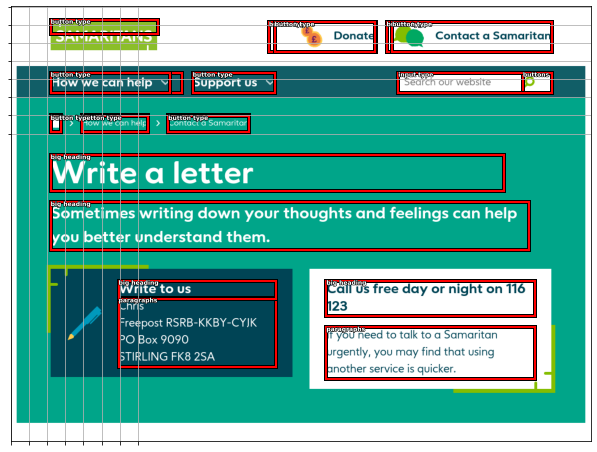

In [387]:
draw_idx(idx, with_filter=True)

{'url': 'https://www.samaritans.org/how-we-can-help/contact-samaritan/write-letter/',
 '_type': 'dict',
 'keyword': 'letter'}

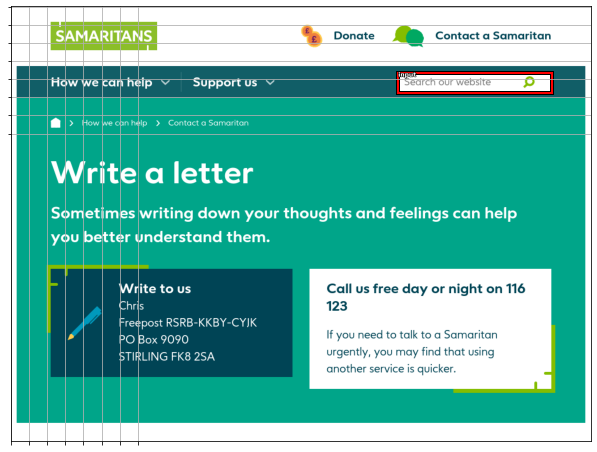

In [386]:
idx = draw_certain_class(cats_reverse['input'])
urls[idx]

193

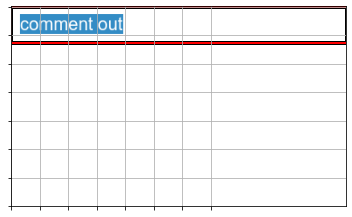

In [378]:
len(get_colors_of_bb(idx, [get_element_bounds(idx, cls=cats_reverse['input'])[0][0]]))

# Select

In [260]:
def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound
    
def filter_button(idx, b_bound):
    return [b_bound[0][0], b_bound[0][1], b_bound[0][2], b_bound[0][3], cats_reverse['button type']]

def filter_select(idx, s_bound):
    return [s_bound[0][0], s_bound[0][1], s_bound[0][2], s_bound[0][3], cats_reverse['select type']]

{'url': 'https://translate.google.com/translate?hl=uk&sl=en&u=https://www.sprayplanet.com/&prev=search',
 '_type': 'dict',
 'keyword': 'spray'}

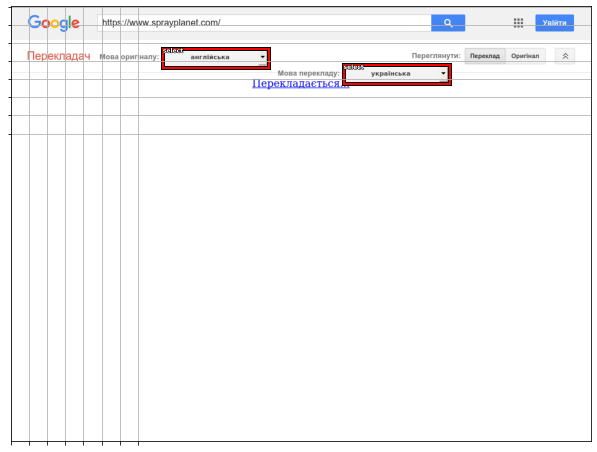

In [329]:
idx = draw_certain_class(cats_reverse['select'])
urls[idx]

261 0.7821025641025641
278 0.3319084259523131
165 0.35103415103415103
18 0.2231800766283525
102 0.2332375478927203
121 0.09482758620689655
190 0.3217993079584775
49 0.06666666666666667
213 0.921719621634732
213 0.8588135593220338
213 0.8588135593220338
261 0.7821025641025641
261 0.5214017094017094
261 0.5214017094017094
261 0.5002307692307693
199 0.9260306686777275
151 0.08823529411764706
152 0.18072289156626506
2 0.84
2 0.84
153 0.35575221238938054
49 0.06666666666666667
128 0.21763085399449036
117 0.2192513368983957
213 0.887347294938918
124 0.6114942528735632
119 0.6351190476190476
107 0.650354609929078
199 0.749692118226601
46 0.6492094861660079
151 0.08823529411764706
2 0.84


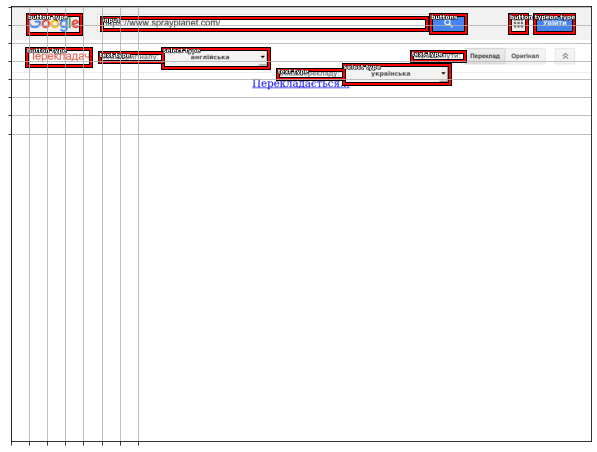

In [335]:
draw_idx(idx, with_filter=True)

# Above Input

In [261]:
# If too small discard (300), else if search keyword found then label as element, else text
def filter_above_input_bound(idx, ai_bound):
    size = get_box_size(ai_bound[0])
    
    if size < 500:
        return []
    
    wc,words = get_num_words(idx, ai_bound, see_results=False, return_words=True)
    
    if "Search" in words or "search" in words or "http" in words:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["input type"]]
    else:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["text type"]]
    
    num_words = get_num_words(idx, ai_bound, see_results=False)

def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound
    
def filter_button(idx, b_bound):
    return [b_bound[0][0], b_bound[0][1], b_bound[0][2], b_bound[0][3], cats_reverse['button type']]

def filter_select(idx, s_bound):
    return [s_bound[0][0], s_bound[0][1], s_bound[0][2], s_bound[0][3], cats_reverse['select type']]

78 0.9163265306122449
2 0.95
181 0.46224489795918366
3 0.8
2 0.95
24 0.3064516129032258
37 0.2653225806451613
70 0.9407258064516129
5 0.910483870967742
79 0.85
141 0.7637096774193548
109 0.8310483870967742
74 0.7705645161290322
7 0.7298387096774194
45 0.9717741935483871
145 0.7842741935483871
6 0.910483870967742
81 0.9165322580645161
4 0.942741935483871
260 0.4568548387096774
3 0.8
2 0.95


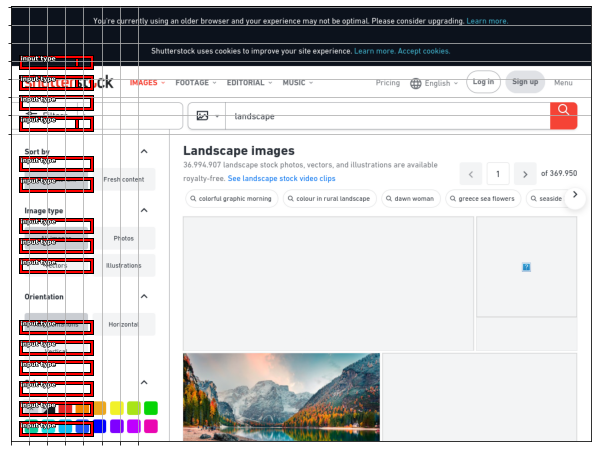

In [309]:
draw_idx(idx, with_filter=True, cls=7)

{'url': 'https://www.shutterstock.com/search/landscape',
 '_type': 'dict',
 'keyword': 'landscape'}

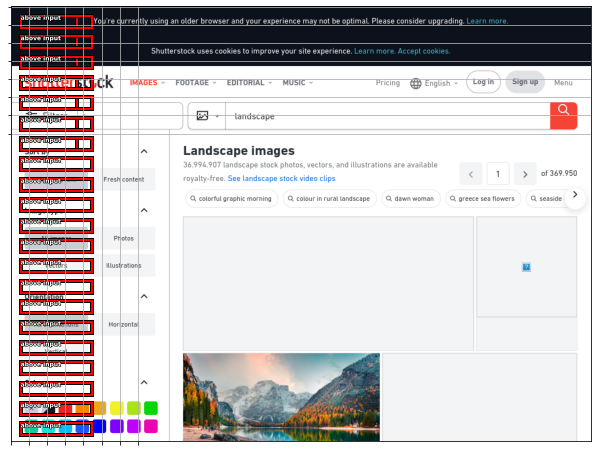

In [308]:
idx = draw_certain_class(7)
urls[idx]

TypeError: 'int' object is not iterable

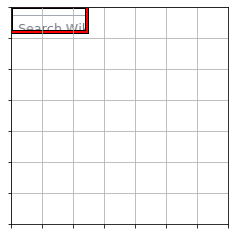

In [278]:
get_num_words(idx, [get_element_bounds(idx, cls=7)[0][0]])

In [304]:
get_box_size(get_element_bounds(idx, cls=7)[0][0])

336.0

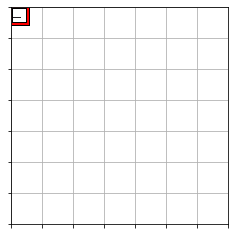

In [239]:
crop = get_crop(idx, [get_element_bounds(idx, cls=7)[5][0]])

{'url': 'https://api.jquery.com/parent/', '_type': 'dict', 'keyword': 'parent'}

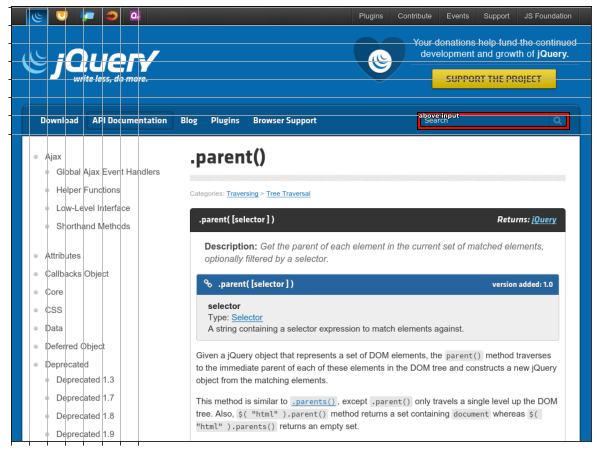

In [194]:
idx = draw_certain_class(7)
urls[idx]

{'level': [1, 2, 3, 4, 5],
 'page_num': [1, 1, 1, 1, 1],
 'block_num': [0, 1, 1, 1, 1],
 'par_num': [0, 0, 1, 1, 1],
 'line_num': [0, 0, 0, 1, 1],
 'word_num': [0, 0, 0, 0, 1],
 'left': [0, 11, 11, 11, 11],
 'top': [0, 8, 8, 8, 8],
 'width': [262, 40, 40, 40, 40],
 'height': [25, 9, 9, 9, 9],
 'conf': ['-1', '-1', '-1', '-1', 28],
 'text': ['', '', '', '', 'ore']}

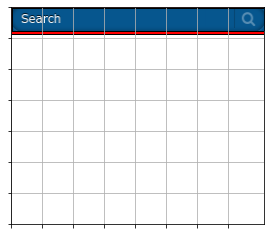

In [198]:
get_text_on_bb(idx, [get_element_bounds(idx, cls=7)[0][0]])

{'url': 'https://www.giffits-werbeartikel.ch/usb-stick-hook-1gb-werbeartikel-340749.htm',
 '_type': 'dict',
 'keyword': 'hook'}

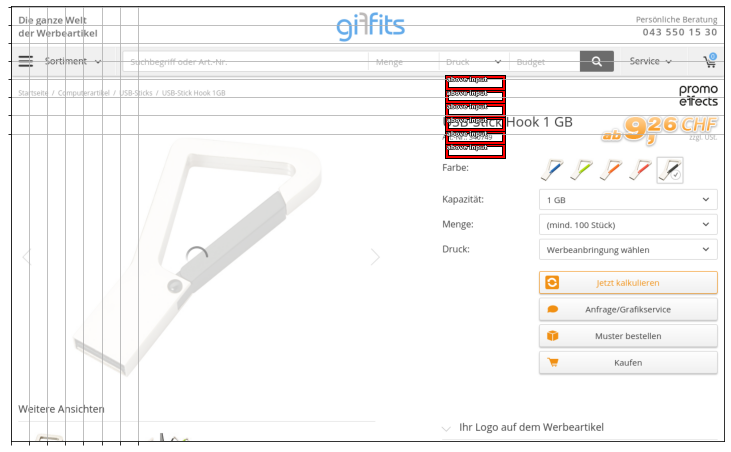

In [151]:
idx = draw_certain_class(7)
urls[idx]

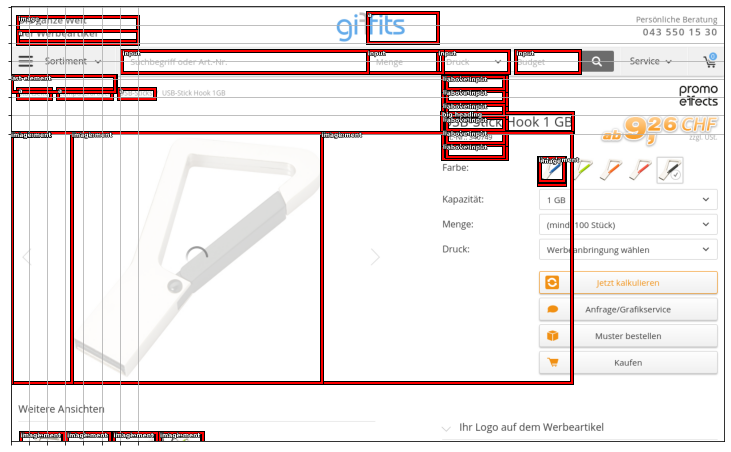

In [163]:
draw_idx(idx, with_banned=False)

In [184]:
ents = {'1': {'coords': [{'bottom': 116, 'top': 79, 'height': 37, 'right': 1064.125, 'left': 1004.0625, 'width': 60.0625}]}, '2': {'coords': [{'bottom': 448.0062561035156, 'top': 411.0062561035156, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 404.0062561035156, 'top': 367.0062561035156, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 360.0062561035156, 'top': 323.0062561035156, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 116.0062484741211, 'top': 79.0062484741211, 'height': 37, 'right': 1004.0625, 'left': 892.5, 'width': 111.5625}, {'bottom': 116.0062484741211, 'top': 79.0062484741211, 'height': 37, 'right': 879.375, 'left': 754.6875, 'width': 124.6875}, {'bottom': 116.0062484741211, 'top': 79.0062484741211, 'height': 37, 'right': 761.25, 'left': 630, 'width': 131.25}, {'bottom': 116.0062484741211, 'top': 79.0062484741211, 'height': 37, 'right': 630, 'left': 196.875, 'width': 433.125}]}, '3': {'coords': []}, '4': {'coords': [{'bottom': 220, 'top': 187, 'height': 33, 'right': 991.578125, 'left': 761.25, 'width': 230.328125}, {'bottom': 3267.6875, 'top': 3233.6875, 'height': 34, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1255.09375, 'top': 1221.09375, 'height': 34, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 761, 'top': 726, 'height': 35, 'right': 1046.75, 'left': 791.25, 'width': 255.5}]}, '5': {'coords': []}, '6': {'coords': []}, '7': {'coords': []}, '8': {'coords': [{'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 651.125, 'left': 593.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 593.125, 'left': 535.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 535.125, 'left': 477.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 477.125, 'left': 419.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 419.125, 'left': 361.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 361.125, 'left': 303.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 303.125, 'left': 245.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 245.125, 'left': 187.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 187.125, 'left': 129.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 129.125, 'left': 71.125, 'width': 58}, {'bottom': 4165.765625, 'top': 4124.765625, 'height': 41, 'right': 71.125, 'left': 13.125, 'width': 58}, {'bottom': 3992.765625, 'top': 3974.765625, 'height': 18, 'right': 811.4375, 'left': 643.125, 'width': 168.3125}, {'bottom': 3969.765625, 'top': 3951.765625, 'height': 18, 'right': 795.03125, 'left': 643.125, 'width': 151.90625}, {'bottom': 3946.765625, 'top': 3928.765625, 'height': 18, 'right': 696.625, 'left': 643.125, 'width': 53.5}, {'bottom': 3923.765625, 'top': 3905.765625, 'height': 18, 'right': 750.640625, 'left': 643.125, 'width': 107.515625}, {'bottom': 3900.765625, 'top': 3882.765625, 'height': 18, 'right': 668.15625, 'left': 643.125, 'width': 25.03125}, {'bottom': 3877.765625, 'top': 3859.765625, 'height': 18, 'right': 720.875, 'left': 643.125, 'width': 77.75}, {'bottom': 3854.765625, 'top': 3836.765625, 'height': 18, 'right': 690.09375, 'left': 643.125, 'width': 46.96875}, {'bottom': 4015.765625, 'top': 3997.765625, 'height': 18, 'right': 396.765625, 'left': 328.125, 'width': 68.640625}, {'bottom': 3992.765625, 'top': 3974.765625, 'height': 18, 'right': 461.84375, 'left': 328.125, 'width': 133.71875}, {'bottom': 3969.765625, 'top': 3951.765625, 'height': 18, 'right': 354.21875, 'left': 328.125, 'width': 26.09375}, {'bottom': 3946.765625, 'top': 3928.765625, 'height': 18, 'right': 393.71875, 'left': 328.125, 'width': 65.59375}, {'bottom': 3923.765625, 'top': 3905.765625, 'height': 18, 'right': 368.171875, 'left': 328.125, 'width': 40.046875}, {'bottom': 3900.765625, 'top': 3882.765625, 'height': 18, 'right': 428.6875, 'left': 328.125, 'width': 100.5625}, {'bottom': 3877.765625, 'top': 3859.765625, 'height': 18, 'right': 396.984375, 'left': 328.125, 'width': 68.859375}, {'bottom': 3854.765625, 'top': 3836.765625, 'height': 18, 'right': 397.046875, 'left': 328.125, 'width': 68.921875}, {'bottom': 4038.765625, 'top': 4020.765625, 'height': 18, 'right': 92.59375, 'left': 13.125, 'width': 79.46875}, {'bottom': 4015.765625, 'top': 3997.765625, 'height': 18, 'right': 112.265625, 'left': 13.125, 'width': 99.140625}, {'bottom': 3992.765625, 'top': 3974.765625, 'height': 18, 'right': 94.34375, 'left': 13.125, 'width': 81.21875}, {'bottom': 3969.765625, 'top': 3951.765625, 'height': 18, 'right': 83.375, 'left': 13.125, 'width': 70.25}, {'bottom': 3946.765625, 'top': 3928.765625, 'height': 18, 'right': 120.71875, 'left': 13.125, 'width': 107.59375}, {'bottom': 3923.765625, 'top': 3905.765625, 'height': 18, 'right': 93.625, 'left': 13.125, 'width': 80.5}, {'bottom': 3900.765625, 'top': 3882.765625, 'height': 18, 'right': 99.078125, 'left': 13.125, 'width': 85.953125}, {'bottom': 3877.765625, 'top': 3859.765625, 'height': 18, 'right': 76.46875, 'left': 13.125, 'width': 63.34375}, {'bottom': 3854.765625, 'top': 3836.765625, 'height': 18, 'right': 151.046875, 'left': 13.125, 'width': 137.921875}, {'bottom': 3756.6875, 'top': 3720.6875, 'height': 36, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3720.6875, 'top': 3672.6875, 'height': 48, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3718.6875, 'top': 3700.6875, 'height': 18, 'right': 168.546875, 'left': 64.03125, 'width': 104.515625}, {'bottom': 649, 'top': 609, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 602, 'top': 562, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 555, 'top': 515, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 508, 'top': 468, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 308, 'top': 268, 'height': 40, 'right': 1182.875, 'left': 1142.875, 'width': 40}, {'bottom': 307, 'top': 267, 'height': 40, 'right': 1130.875, 'left': 1090.875, 'width': 40}, {'bottom': 307, 'top': 267, 'height': 40, 'right': 1078.875, 'left': 1038.875, 'width': 40}, {'bottom': 307, 'top': 267, 'height': 40, 'right': 1026.875, 'left': 986.875, 'width': 40}, {'bottom': 307, 'top': 267, 'height': 40, 'right': 974.875, 'left': 934.875, 'width': 40}, {'bottom': 181, 'top': 159, 'height': 22, 'right': 1246.875, 'left': 1179.875, 'width': 67}, {'bottom': 162, 'top': 145, 'height': 17, 'right': 394.375, 'left': 332.765625, 'width': 61.609375}, {'bottom': 162, 'top': 145, 'height': 17, 'right': 319.03125, 'left': 224.546875, 'width': 94.484375}, {'bottom': 162, 'top': 145, 'height': 17, 'right': 210.8125, 'left': 83, 'width': 127.8125}, {'bottom': 162, 'top': 145, 'height': 17, 'right': 69.265625, 'left': 13.125, 'width': 56.140625}, {'bottom': 116, 'top': 94, 'height': 22, 'right': 1244.25, 'left': 1220.625, 'width': 23.625}, {'bottom': 54, 'top': 18, 'height': 36, 'right': 1246.875, 'left': 1008.875, 'width': 238}, {'bottom': 63, 'top': 11, 'height': 52, 'right': 753.75, 'left': 630, 'width': 123.75}, {'bottom': 65, 'top': 43, 'height': 22, 'right': 223.125, 'left': 13.125, 'width': 210}]}, '9': {'coords': [{'bottom': 1538.09375, 'top': 1338.09375, 'height': 200, 'right': 239.03125, 'left': 39.03125, 'width': 200}, {'bottom': 270, 'top': 269, 'height': 1, 'right': 1143.875, 'left': 1142.875, 'width': 1}, {'bottom': 309, 'top': 269, 'height': 40, 'right': 1182.875, 'left': 1142.875, 'width': 40}, {'bottom': 270, 'top': 269, 'height': 1, 'right': 1091.875, 'left': 1090.875, 'width': 1}, {'bottom': 309, 'top': 269, 'height': 40, 'right': 1130.875, 'left': 1090.875, 'width': 40}, {'bottom': 270, 'top': 269, 'height': 1, 'right': 1039.875, 'left': 1038.875, 'width': 1}, {'bottom': 309, 'top': 269, 'height': 40, 'right': 1078.875, 'left': 1038.875, 'width': 40}, {'bottom': 270, 'top': 269, 'height': 1, 'right': 987.875, 'left': 986.875, 'width': 1}, {'bottom': 309, 'top': 269, 'height': 40, 'right': 1026.875, 'left': 986.875, 'width': 40}, {'bottom': 270, 'top': 269, 'height': 1, 'right': 935.875, 'left': 934.875, 'width': 1}, {'bottom': 309, 'top': 269, 'height': 40, 'right': 974.875, 'left': 934.875, 'width': 40}, {'bottom': 176, 'top': 141, 'height': 35, 'right': 1246.875, 'left': 1179.875, 'width': 67}, {'bottom': 828.5, 'top': 753.5, 'height': 75, 'right': 338.125, 'left': 263.125, 'width': 75}, {'bottom': 828.5, 'top': 753.5, 'height': 75, 'right': 256.125, 'left': 181.125, 'width': 75}, {'bottom': 828.5, 'top': 753.5, 'height': 75, 'right': 174.125, 'left': 99.125, 'width': 75}, {'bottom': 828.5, 'top': 753.5, 'height': 75, 'right': 92.125, 'left': 17.125, 'width': 75}, {'bottom': 60, 'top': 18, 'height': 42, 'right': 1246.875, 'left': 1008.875, 'width': 238}, {'bottom': 60, 'top': 18, 'height': 42, 'right': 223.125, 'left': 13.125, 'width': 210}]}, '10': {'coords': [{'bottom': 448, 'top': 267, 'height': 181, 'right': 1246.875, 'left': 761.25, 'width': 485.625}]}, '11': {'coords': []}, '12': {'coords': []}, '13': {'coords': [{'bottom': 3995.765625, 'top': 3834.765625, 'height': 161, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 4018.765625, 'top': 3834.765625, 'height': 184, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 4041.765625, 'top': 3834.765625, 'height': 207, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1184.375, 'left': 81.875, 'width': 1102.5}, {'bottom': 2619.09375, 'top': 2619.09375, 'height': 0, 'right': 1375.59375, 'left': 115.59375, 'width': 1260}, {'bottom': 656, 'top': 609, 'height': 47, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 609, 'top': 562, 'height': 47, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 562, 'top': 515, 'height': 47, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 515, 'top': 468, 'height': 47, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 267, 'top': 267, 'height': 0, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 244, 'top': 189, 'height': 55, 'right': 1244.875, 'left': 1038.875, 'width': 206}, {'bottom': 178, 'top': 141, 'height': 37, 'right': 1246.875, 'left': 945, 'width': 301.875}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 341.125, 'left': 13.125, 'width': 328}]}, '14': {'coords': [{'bottom': 3995.765625, 'top': 3972.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3972.765625, 'top': 3949.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3949.765625, 'top': 3926.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3926.765625, 'top': 3903.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3903.765625, 'top': 3880.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3880.765625, 'top': 3857.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3857.765625, 'top': 3834.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 4018.765625, 'top': 3995.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3995.765625, 'top': 3972.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3972.765625, 'top': 3949.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3949.765625, 'top': 3926.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3926.765625, 'top': 3903.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3903.765625, 'top': 3880.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3880.765625, 'top': 3857.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3857.765625, 'top': 3834.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 4041.765625, 'top': 4018.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 4018.765625, 'top': 3995.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3995.765625, 'top': 3972.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3972.765625, 'top': 3949.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3949.765625, 'top': 3926.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3926.765625, 'top': 3903.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3903.765625, 'top': 3880.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3880.765625, 'top': 3857.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3857.765625, 'top': 3834.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1184.375, 'left': 1000.625, 'width': 183.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1000.625, 'left': 816.875, 'width': 183.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 816.875, 'left': 633.125, 'width': 183.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 633.125, 'left': 449.375, 'width': 183.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 449.375, 'left': 265.625, 'width': 183.75}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 265.625, 'left': 81.875, 'width': 183.75}, {'bottom': 3139.6875, 'top': 2915.09375, 'height': 224.59375, 'right': 962.59375, 'left': 647.59375, 'width': 315}, {'bottom': 3164.6875, 'top': 2915.09375, 'height': 249.59375, 'right': 619.59375, 'left': 304.59375, 'width': 315}, {'bottom': 2915.09375, 'top': 2619.09375, 'height': 296, 'right': 1130.59375, 'left': 815.59375, 'width': 315}, {'bottom': 2915.09375, 'top': 2619.09375, 'height': 296, 'right': 787.59375, 'left': 472.59375, 'width': 315}, {'bottom': 2915.09375, 'top': 2619.09375, 'height': 296, 'right': 444.59375, 'left': 129.59375, 'width': 315}, {'bottom': 649, 'top': 609, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 602, 'top': 562, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 555, 'top': 515, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 508, 'top': 468, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 313, 'top': 267, 'height': 46, 'right': 1185.875, 'left': 1139.875, 'width': 46}, {'bottom': 313, 'top': 267, 'height': 46, 'right': 1133.875, 'left': 1087.875, 'width': 46}, {'bottom': 313, 'top': 267, 'height': 46, 'right': 1081.875, 'left': 1035.875, 'width': 46}, {'bottom': 313, 'top': 267, 'height': 46, 'right': 1029.875, 'left': 983.875, 'width': 46}, {'bottom': 313, 'top': 267, 'height': 46, 'right': 977.875, 'left': 931.875, 'width': 46}, {'bottom': 244, 'top': 189, 'height': 55, 'right': 1244.875, 'left': 1038.875, 'width': 206}, {'bottom': 178, 'top': 141, 'height': 37, 'right': 1246.875, 'left': 1155.875, 'width': 91}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 337.125, 'left': 263.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 255.125, 'left': 181.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 173.125, 'left': 99.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 91.125, 'left': 17.125, 'width': 74}]}, '15': {'coords': [{'bottom': 4462.765625, 'top': 4446.765625, 'height': 16, 'right': 907.453125, 'left': 559.453125, 'width': 348}, {'bottom': 4531.765625, 'top': 4267.765625, 'height': 264, 'right': 823.453125, 'left': 467.453125, 'width': 356}, {'bottom': 4220.765625, 'top': 4204.765625, 'height': 16, 'right': 448.828125, 'left': 125.140625, 'width': 323.6875}, {'bottom': 4220.765625, 'top': 4204.765625, 'height': 16, 'right': 125.140625, 'left': 119.09375, 'width': 6.046875}, {'bottom': 4220.765625, 'top': 4204.765625, 'height': 16, 'right': 119.09375, 'left': 13.125, 'width': 105.96875}, {'bottom': 4220.765625, 'top': 4204.765625, 'height': 16, 'right': 448.828125, 'left': 0, 'width': 448.828125}, {'bottom': 4220.765625, 'top': 4204.765625, 'height': 16, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 4201.765625, 'top': 4185.765625, 'height': 16, 'right': 643.9375, 'left': 240.109375, 'width': 403.828125}, {'bottom': 4201.765625, 'top': 4185.765625, 'height': 16, 'right': 234.234375, 'left': 0, 'width': 234.234375}, {'bottom': 4204.765625, 'top': 4165.765625, 'height': 39, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 4124.765625, 'top': 4124.765625, 'height': 0, 'right': 931.875, 'left': 13.125, 'width': 918.75}, {'bottom': 4109.765625, 'top': 4108.765625, 'height': 1, 'right': 931.875, 'left': 13.125, 'width': 918.75}, {'bottom': 4098.765625, 'top': 4075.765625, 'height': 23, 'right': 931.875, 'left': 13.125, 'width': 918.75}, {'bottom': 4165.765625, 'top': 4075.765625, 'height': 90, 'right': 945, 'left': 0, 'width': 945}, {'bottom': 4165.765625, 'top': 4075.765625, 'height': 90, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 3874.765625, 'top': 3840.765625, 'height': 34, 'right': 1164.125, 'left': 1130.125, 'width': 34}, {'bottom': 3874.765625, 'top': 3840.765625, 'height': 34, 'right': 1121.125, 'left': 1087.125, 'width': 34}, {'bottom': 3874.765625, 'top': 3840.765625, 'height': 34, 'right': 1078.125, 'left': 1044.125, 'width': 34}, {'bottom': 3874.765625, 'top': 3840.765625, 'height': 34, 'right': 1035.125, 'left': 1001.125, 'width': 34}, {'bottom': 3874.765625, 'top': 3840.765625, 'height': 34, 'right': 992.125, 'left': 958.125, 'width': 34}, {'bottom': 3840.765625, 'top': 3840.765625, 'height': 0, 'right': 1246.875, 'left': 958.125, 'width': 288.75}, {'bottom': 3825.765625, 'top': 3824.765625, 'height': 1, 'right': 1246.875, 'left': 958.125, 'width': 288.75}, {'bottom': 3814.765625, 'top': 3791.765625, 'height': 23, 'right': 1246.875, 'left': 958.125, 'width': 288.75}, {'bottom': 3953.84375, 'top': 3791.765625, 'height': 162.078125, 'right': 1260, 'left': 945, 'width': 315}, {'bottom': 3995.765625, 'top': 3834.765625, 'height': 161, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3825.765625, 'top': 3824.765625, 'height': 1, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3814.765625, 'top': 3791.765625, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 4075.765625, 'top': 3791.765625, 'height': 284, 'right': 945, 'left': 630, 'width': 315}, {'bottom': 4018.765625, 'top': 3834.765625, 'height': 184, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3825.765625, 'top': 3824.765625, 'height': 1, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3814.765625, 'top': 3791.765625, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 4075.765625, 'top': 3791.765625, 'height': 284, 'right': 630, 'left': 315, 'width': 315}, {'bottom': 4041.765625, 'top': 3834.765625, 'height': 207, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3825.765625, 'top': 3824.765625, 'height': 1, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3814.765625, 'top': 3791.765625, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 4075.765625, 'top': 3791.765625, 'height': 284, 'right': 315, 'left': 0, 'width': 315}, {'bottom': 4075.765625, 'top': 3791.765625, 'height': 284, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 3739.6875, 'top': 3670.6875, 'height': 69, 'right': 1246.875, 'left': 1018.765625, 'width': 228.109375}, {'bottom': 3717.6875, 'top': 3674.6875, 'height': 43, 'right': 1001.125, 'left': 958.125, 'width': 43}, {'bottom': 3663.6875, 'top': 3662.6875, 'height': 1, 'right': 1246.875, 'left': 958.125, 'width': 288.75}, {'bottom': 3652.6875, 'top': 3629.6875, 'height': 23, 'right': 1246.875, 'left': 958.125, 'width': 288.75}, {'bottom': 3791.765625, 'top': 3629.6875, 'height': 162.078125, 'right': 1260, 'left': 945, 'width': 315}, {'bottom': 3699.6875, 'top': 3678.6875, 'height': 21, 'right': 719.125, 'left': 643.125, 'width': 76}, {'bottom': 3663.6875, 'top': 3662.6875, 'height': 1, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3652.6875, 'top': 3629.6875, 'height': 23, 'right': 931.875, 'left': 643.125, 'width': 288.75}, {'bottom': 3791.765625, 'top': 3629.6875, 'height': 162.078125, 'right': 945, 'left': 630, 'width': 315}, {'bottom': 3756.6875, 'top': 3672.6875, 'height': 84, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3663.6875, 'top': 3662.6875, 'height': 1, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3652.6875, 'top': 3629.6875, 'height': 23, 'right': 616.875, 'left': 328.125, 'width': 288.75}, {'bottom': 3791.765625, 'top': 3629.6875, 'height': 162.078125, 'right': 630, 'left': 315, 'width': 315}, {'bottom': 3721.6875, 'top': 3698.6875, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3695.6875, 'top': 3672.6875, 'height': 23, 'right': 216.65625, 'left': 99.828125, 'width': 116.828125}, {'bottom': 3697.6875, 'top': 3672.6875, 'height': 25, 'right': 99.828125, 'left': 73.828125, 'width': 26}, {'bottom': 3695.6875, 'top': 3672.6875, 'height': 23, 'right': 73.828125, 'left': 13.125, 'width': 60.703125}, {'bottom': 3697.6875, 'top': 3672.6875, 'height': 25, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3663.6875, 'top': 3662.6875, 'height': 1, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3652.6875, 'top': 3629.6875, 'height': 23, 'right': 301.875, 'left': 13.125, 'width': 288.75}, {'bottom': 3791.765625, 'top': 3629.6875, 'height': 162.078125, 'right': 315, 'left': 0, 'width': 315}, {'bottom': 3791.765625, 'top': 3629.6875, 'height': 162.078125, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 4220.765625, 'top': 3629.6875, 'height': 591.078125, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 4267.765625, 'top': 3603.6875, 'height': 664.078125, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1184.375, 'left': 81.875, 'width': 1102.5}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1184.375, 'left': 81.875, 'width': 1102.5}, {'bottom': 3560.6875, 'top': 3327.6875, 'height': 233, 'right': 1291.875, 'left': 31.875, 'width': 1260}, {'bottom': 3562.6875, 'top': 3327.6875, 'height': 235, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 3327.6875, 'top': 3301.6875, 'height': 26, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 3139.6875, 'top': 3039.6875, 'height': 100, 'right': 962.59375, 'left': 647.59375, 'width': 315}, {'bottom': 3022.6875, 'top': 3006.6875, 'height': 16, 'right': 962.59375, 'left': 647.59375, 'width': 315}, {'bottom': 3139.6875, 'top': 3006.6875, 'height': 133, 'right': 962.59375, 'left': 647.59375, 'width': 315}, {'bottom': 3164.6875, 'top': 3039.6875, 'height': 125, 'right': 619.59375, 'left': 304.59375, 'width': 315}, {'bottom': 3022.6875, 'top': 3006.6875, 'height': 16, 'right': 619.59375, 'left': 304.59375, 'width': 315}, {'bottom': 3164.6875, 'top': 3006.6875, 'height': 158, 'right': 619.59375, 'left': 304.59375, 'width': 315}, {'bottom': 2843.6875, 'top': 2743.6875, 'height': 100, 'right': 1130.59375, 'left': 815.59375, 'width': 315}, {'bottom': 2726.6875, 'top': 2710.6875, 'height': 16, 'right': 1130.59375, 'left': 815.59375, 'width': 315}, {'bottom': 2843.6875, 'top': 2710.6875, 'height': 133, 'right': 1130.59375, 'left': 815.59375, 'width': 315}, {'bottom': 2868.6875, 'top': 2743.6875, 'height': 125, 'right': 787.59375, 'left': 472.59375, 'width': 315}, {'bottom': 2726.6875, 'top': 2710.6875, 'height': 16, 'right': 787.59375, 'left': 472.59375, 'width': 315}, {'bottom': 2868.6875, 'top': 2710.6875, 'height': 158, 'right': 787.59375, 'left': 472.59375, 'width': 315}, {'bottom': 2843.6875, 'top': 2743.6875, 'height': 100, 'right': 444.59375, 'left': 129.59375, 'width': 315}, {'bottom': 2726.6875, 'top': 2710.6875, 'height': 16, 'right': 444.59375, 'left': 129.59375, 'width': 315}, {'bottom': 2843.6875, 'top': 2710.6875, 'height': 133, 'right': 444.59375, 'left': 129.59375, 'width': 315}, {'bottom': 3164.6875, 'top': 2619.09375, 'height': 545.59375, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 2580.09375, 'top': 2546.09375, 'height': 34, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 2481.09375, 'top': 2081.09375, 'height': 400, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 2049.09375, 'top': 2015.09375, 'height': 34, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1791.09375, 'top': 1340.09375, 'height': 451, 'right': 1290.078125, 'left': 282.078125, 'width': 1008}, {'bottom': 1793.09375, 'top': 1340.09375, 'height': 453, 'right': 1290.078125, 'left': 250.078125, 'width': 1040}, {'bottom': 1887.09375, 'top': 1870.09375, 'height': 17, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1897.09375, 'top': 1841.09375, 'height': 56, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1822.09375, 'top': 1821.09375, 'height': 1, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1810.09375, 'top': 1784.09375, 'height': 26, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1773.09375, 'top': 1772.09375, 'height': 1, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1761.09375, 'top': 1735.09375, 'height': 26, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1724.09375, 'top': 1723.09375, 'height': 1, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1712.09375, 'top': 1686.09375, 'height': 26, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1675.09375, 'top': 1674.09375, 'height': 1, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1663.09375, 'top': 1637.09375, 'height': 26, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1626.09375, 'top': 1625.09375, 'height': 1, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1616.09375, 'top': 1587.09375, 'height': 29, 'right': 182.59375, 'left': 95.484375, 'width': 87.109375}, {'bottom': 1897.09375, 'top': 1585.09375, 'height': 312, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1575.09375, 'top': 1550.09375, 'height': 25, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1897.09375, 'top': 1338.09375, 'height': 559, 'right': 264.078125, 'left': 14, 'width': 250.078125}, {'bottom': 1897.09375, 'top': 1340.09375, 'height': 557, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1931.484375, 'top': 1327.09375, 'height': 604.390625, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1283.09375, 'top': 1267.09375, 'height': 16, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1955.09375, 'top': 1267.09375, 'height': 688, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1987.09375, 'top': 1186.09375, 'height': 801, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1154.09375, 'top': 1154, 'height': 0.09375, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1134, 'top': 1133, 'height': 1, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1133, 'top': 1094, 'height': 39, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1123, 'top': 1107, 'height': 16, 'right': 778.25, 'left': 760.25, 'width': 18}, {'bottom': 1134, 'top': 1094, 'height': 40, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1134, 'top': 1094, 'height': 40, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1042, 'top': 1041, 'height': 1, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1041, 'top': 1002, 'height': 39, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1031, 'top': 1015, 'height': 16, 'right': 778.25, 'left': 760.25, 'width': 18}, {'bottom': 1042, 'top': 1002, 'height': 40, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 1042, 'top': 1002, 'height': 40, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 1042, 'top': 1002, 'height': 40, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 950, 'top': 949, 'height': 1, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 949, 'top': 910, 'height': 39, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 939, 'top': 923, 'height': 16, 'right': 778.25, 'left': 760.25, 'width': 18}, {'bottom': 950, 'top': 910, 'height': 40, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 950, 'top': 910, 'height': 40, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 858, 'top': 857, 'height': 1, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 857, 'top': 818, 'height': 39, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 847, 'top': 831, 'height': 16, 'right': 778.25, 'left': 760.25, 'width': 18}, {'bottom': 858, 'top': 818, 'height': 40, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 766, 'top': 765, 'height': 1, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 755, 'top': 739, 'height': 16, 'right': 778.25, 'left': 760.25, 'width': 18}, {'bottom': 726, 'top': 726, 'height': 0, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 766, 'top': 726, 'height': 40, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 555, 'top': 515, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 555, 'top': 515, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 508, 'top': 468, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 508, 'top': 468, 'height': 40, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 656, 'top': 468, 'height': 188, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 447.796875, 'top': 411, 'height': 36.796875, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 448, 'top': 411, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 448, 'top': 411, 'height': 37, 'right': 918.75, 'left': 761.25, 'width': 157.5}, {'bottom': 403.796875, 'top': 367, 'height': 36.796875, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 404, 'top': 367, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 404, 'top': 367, 'height': 37, 'right': 918.75, 'left': 761.25, 'width': 157.5}, {'bottom': 359.796875, 'top': 323, 'height': 36.796875, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 360, 'top': 323, 'height': 37, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 360, 'top': 323, 'height': 37, 'right': 918.75, 'left': 761.25, 'width': 157.5}, {'bottom': 448, 'top': 323, 'height': 125, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 448, 'top': 323, 'height': 125, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 301, 'top': 283, 'height': 18, 'right': 1181.875, 'left': 1163.875, 'width': 18}, {'bottom': 323, 'top': 267, 'height': 56, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 323, 'top': 267, 'height': 56, 'right': 1246.875, 'left': 931.875, 'width': 315}, {'bottom': 304, 'top': 267, 'height': 37, 'right': 918.75, 'left': 761.25, 'width': 157.5}, {'bottom': 304, 'top': 267, 'height': 37, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 323, 'top': 267, 'height': 56, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 243, 'top': 224, 'height': 19, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 244, 'top': 189, 'height': 55, 'right': 1244.875, 'left': 1038.875, 'width': 206}, {'bottom': 244, 'top': 189, 'height': 55, 'right': 1246.875, 'left': 1038.875, 'width': 208}, {'bottom': 244, 'top': 189, 'height': 55, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 178, 'top': 141, 'height': 37, 'right': 1246.875, 'left': 1179.875, 'width': 67}, {'bottom': 171, 'top': 141, 'height': 30, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 656, 'top': 170, 'height': 486, 'right': 1246.875, 'left': 761.25, 'width': 485.625}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 337.125, 'left': 263.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 255.125, 'left': 181.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 173.125, 'left': 99.125, 'width': 74}, {'bottom': 827.5, 'top': 753.5, 'height': 74, 'right': 91.125, 'left': 17.125, 'width': 74}, {'bottom': 840, 'top': 748, 'height': 92, 'right': 611.125, 'left': 13.125, 'width': 598}, {'bottom': 840, 'top': 748, 'height': 92, 'right': 611.125, 'left': 13.125, 'width': 598}, {'bottom': 822, 'top': 748, 'height': 74, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 824, 'top': 748, 'height': 76, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 734, 'top': 733, 'height': 1, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 734, 'top': 694, 'height': 40, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 844, 'top': 694, 'height': 150, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 844, 'top': 694, 'height': 150, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 455, 'top': 435, 'height': 20, 'right': 658.125, 'left': 628.125, 'width': 30}, {'bottom': 451, 'top': 435, 'height': 16, 'right': 658.125, 'left': 628.125, 'width': 30}, {'bottom': 664, 'top': 223, 'height': 441, 'right': 548.625, 'left': 107.625, 'width': 441}, {'bottom': 664, 'top': 223, 'height': 441, 'right': 548.625, 'left': 107.625, 'width': 441}, {'bottom': 664, 'top': 223, 'height': 441, 'right': 548.625, 'left': 107.625, 'width': 441}, {'bottom': 664, 'top': 223, 'height': 441, 'right': 548.625, 'left': 107.625, 'width': 441}, {'bottom': 455, 'top': 435, 'height': 20, 'right': 43.125, 'left': 13.125, 'width': 30}, {'bottom': 451, 'top': 435, 'height': 16, 'right': 43.125, 'left': 13.125, 'width': 30}, {'bottom': 664, 'top': 223, 'height': 441, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 848, 'top': 223, 'height': 625, 'right': 643.125, 'left': 13.125, 'width': 630}, {'bottom': 178, 'top': 162, 'height': 16, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 162, 'top': 146, 'height': 16, 'right': 520.078125, 'left': 13.125, 'width': 506.953125}, {'bottom': 162, 'top': 146, 'height': 16, 'right': 1071.515625, 'left': 13.125, 'width': 1058.390625}, {'bottom': 162, 'top': 146, 'height': 16, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 162, 'top': 123, 'height': 39, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 122, 'top': 73, 'height': 49, 'right': 1260, 'left': 1258, 'width': 2}, {'bottom': 96.09375, 'top': 82.09375, 'height': 14, 'right': 1245.875, 'left': 1231.875, 'width': 14}, {'bottom': 101.125, 'top': 88, 'height': 13.125, 'right': 1243.25, 'left': 1230.125, 'width': 13.125}, {'bottom': 110.625, 'top': 87, 'height': 23.625, 'right': 1244.25, 'left': 1220.625, 'width': 23.625}, {'bottom': 110.625, 'top': 87, 'height': 23.625, 'right': 1244.25, 'left': 1220.625, 'width': 23.625}, {'bottom': 110.625, 'top': 87, 'height': 23.625, 'right': 1246.875, 'left': 1220.625, 'width': 26.25}, {'bottom': 103, 'top': 72, 'height': 31, 'right': 1246.875, 'left': 1220.625, 'width': 26.25}, {'bottom': 123, 'top': 72, 'height': 51, 'right': 1246.875, 'left': 1220.625, 'width': 26.25}, {'bottom': 122, 'top': 73, 'height': 49, 'right': 1196.375, 'left': 1194.375, 'width': 2}, {'bottom': 101.328125, 'top': 90.328125, 'height': 11, 'right': 1166.171875, 'left': 1155.171875, 'width': 11}, {'bottom': 101.328125, 'top': 90.328125, 'height': 11, 'right': 1166.171875, 'left': 1155.171875, 'width': 11}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 1166.171875, 'left': 1092.25, 'width': 73.921875}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 1210.375, 'left': 1092.25, 'width': 118.125}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 1194.375, 'left': 1076.25, 'width': 118.125}, {'bottom': 123, 'top': 72, 'height': 51, 'right': 1194.375, 'left': 1076.25, 'width': 118.125}, {'bottom': 123, 'top': 72, 'height': 51, 'right': 1194.375, 'left': 1076.25, 'width': 118.125}, {'bottom': 122, 'top': 73, 'height': 49, 'right': 185.75, 'left': 183.75, 'width': 2}, {'bottom': 101.328125, 'top': 90.328125, 'height': 11, 'right': 159.203125, 'left': 148.203125, 'width': 11}, {'bottom': 101.328125, 'top': 90.328125, 'height': 11, 'right': 159.203125, 'left': 148.203125, 'width': 11}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 178.71875, 'left': 40.578125, 'width': 138.140625}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 178.71875, 'left': 39.125, 'width': 139.59375}, {'bottom': 114, 'top': 88, 'height': 26, 'right': 39.125, 'left': 13.125, 'width': 26}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 183.75, 'left': 13.125, 'width': 170.625}, {'bottom': 105, 'top': 89, 'height': 16, 'right': 183.75, 'left': 13.125, 'width': 170.625}, {'bottom': 122, 'top': 72, 'height': 50, 'right': 183.75, 'left': 13.125, 'width': 170.625}, {'bottom': 90.015625, 'top': 79.015625, 'height': 11, 'right': 993.0625, 'left': 982.0625, 'width': 11}, {'bottom': 116, 'top': 79, 'height': 37, 'right': 1004.0625, 'left': 892.5, 'width': 111.5625}, {'bottom': 91.328125, 'top': 80.328125, 'height': 11, 'right': 865.375, 'left': 854.375, 'width': 11}, {'bottom': 91.328125, 'top': 80.328125, 'height': 11, 'right': 865.375, 'left': 854.375, 'width': 11}, {'bottom': 115.796875, 'top': 79, 'height': 36.796875, 'right': 879.375, 'left': 754.6875, 'width': 124.6875}, {'bottom': 116, 'top': 79, 'height': 37, 'right': 879.375, 'left': 754.6875, 'width': 124.6875}, {'bottom': 90.015625, 'top': 79.015625, 'height': 11, 'right': 749.25, 'left': 738.25, 'width': 11}, {'bottom': 116, 'top': 79, 'height': 37, 'right': 761.25, 'left': 630, 'width': 131.25}, {'bottom': 90.015625, 'top': 79.015625, 'height': 11, 'right': 618, 'left': 607, 'width': 11}, {'bottom': 116, 'top': 79, 'height': 37, 'right': 630, 'left': 196.875, 'width': 433.125}, {'bottom': 123, 'top': 72, 'height': 51, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 72, 'top': 72, 'height': 0, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 123, 'top': 72, 'height': 51, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 62, 'top': 18, 'height': 44, 'right': 223.125, 'left': 13.125, 'width': 210}, {'bottom': 72, 'top': 0, 'height': 72, 'right': 1260, 'left': 0, 'width': 1260}, {'bottom': 4531.765625, 'top': 0, 'height': 4531.765625, 'right': 1260, 'left': 0, 'width': 1260}]}, '16': {'coords': [{'bottom': 1129, 'top': 1094, 'height': 35, 'right': 940.046875, 'left': 791.25, 'width': 148.796875}, {'bottom': 1037, 'top': 1002, 'height': 35, 'right': 972.375, 'left': 791.25, 'width': 181.125}, {'bottom': 945, 'top': 910, 'height': 35, 'right': 889.28125, 'left': 791.25, 'width': 98.03125}, {'bottom': 853, 'top': 818, 'height': 35, 'right': 884.390625, 'left': 791.25, 'width': 93.140625}]}}

In [190]:
pents = process_ents(ents)

cls: 4 box: [3233.6875    0.     3267.6875 1260.    ], bs: 42840.0
cls: 4 box: [1221.09375    0.      1255.09375 1260.     ], bs: 42840.0
cls: 8 box: [4124.765625  593.125    4165.765625  651.125   ], bs: 2378.0
cls: 8 box: [4124.765625  535.125    4165.765625  593.125   ], bs: 2378.0
cls: 8 box: [4124.765625  477.125    4165.765625  535.125   ], bs: 2378.0
cls: 8 box: [4124.765625  419.125    4165.765625  477.125   ], bs: 2378.0
cls: 8 box: [4124.765625  361.125    4165.765625  419.125   ], bs: 2378.0
cls: 8 box: [4124.765625  303.125    4165.765625  361.125   ], bs: 2378.0
cls: 8 box: [4124.765625  245.125    4165.765625  303.125   ], bs: 2378.0
cls: 8 box: [4124.765625  187.125    4165.765625  245.125   ], bs: 2378.0
cls: 8 box: [4124.765625  129.125    4165.765625  187.125   ], bs: 2378.0
cls: 8 box: [4124.765625   71.125    4165.765625  129.125   ], bs: 2378.0
cls: 8 box: [4124.765625   13.125    4165.765625   71.125   ], bs: 2378.0
cls: 8 box: [3974.765625  643.125    3992.765625

In [191]:
pents

[(array([  79.    , 1004.0625,  116.    , 1064.125 ]), 1),
 (array([ 411.0062561,  931.875    ,  448.0062561, 1246.875    ]), 2),
 (array([ 367.0062561,  931.875    ,  404.0062561, 1246.875    ]), 2),
 (array([ 323.0062561,  931.875    ,  360.0062561, 1246.875    ]), 2),
 (array([  79.00624847,  892.5       ,  116.00624847, 1004.0625    ]), 2),
 (array([ 79.00624847, 754.6875    , 116.00624847, 879.375     ]), 2),
 (array([ 79.00624847, 630.        , 116.00624847, 761.25      ]), 2),
 (array([ 79.00624847, 196.875     , 116.00624847, 630.        ]), 2),
 (array([187.      , 761.25    , 220.      , 991.578125]), 4),
 (array([ 726.  ,  791.25,  761.  , 1046.75]), 4),
 (array([ 609.   ,  931.875,  649.   , 1246.875]), 8),
 (array([ 562.   ,  931.875,  602.   , 1246.875]), 8),
 (array([ 515.   ,  931.875,  555.   , 1246.875]), 8),
 (array([ 468.   ,  931.875,  508.   , 1246.875]), 8),
 (array([ 267.   ,  986.875,  307.   , 1026.875]), 8),
 (array([267.   , 934.875, 307.   , 974.875]), 8),


In [186]:
get_element_count(pents)

defaultdict(int,
            {1: 1,
             2: 7,
             4: 4,
             8: 56,
             9: 18,
             10: 1,
             13: 13,
             14: 50,
             15: 229,
             16: 4})

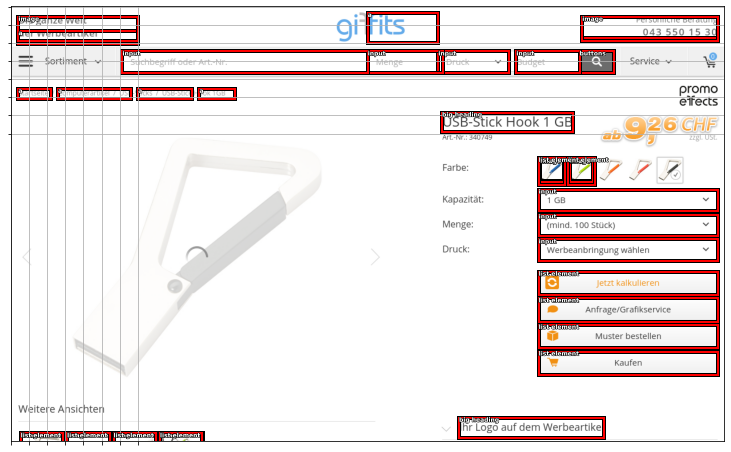

In [192]:
draw_idx(idx, ents=pents, with_banned=False)

{'level': [1],
 'page_num': [1],
 'block_num': [0],
 'par_num': [0],
 'line_num': [0],
 'word_num': [0],
 'left': [0],
 'top': [0],
 'width': [106],
 'height': [18],
 'conf': ['-1'],
 'text': ['']}

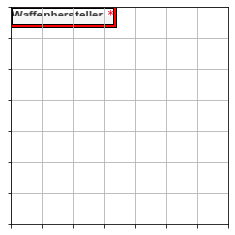

In [145]:
get_text_on_bb(idx, [get_element_bounds(idx, cls=7)[1][0]])

# List Elements

In [262]:
def filter_li_bound(idx, li_bound):
    num_words = get_num_words(idx, li_bound, see_results=False)
    
    if num_words < 3:
        return [li_bound[0][0], li_bound[0][1], li_bound[0][2], li_bound[0][3], cats_reverse["button type"]]
    else:
        return [li_bound[0][0], li_bound[0][1], li_bound[0][2], li_bound[0][3], cats_reverse["text type"]]

def draw_list_element_with_filter(idx):
    return draw_idx(idx, cls=cats_reverse["list element"], with_filter=True)

def draw_random_list_elements():
    return draw_certain_class(cats_reverse['list element'])

# If too small discard (300), else if search keyword found then label as element, else text
def filter_above_input_bound(idx, ai_bound):
    size = get_box_size(ai_bound[0])
    
    if size < 500:
        return []
    
    wc,words = get_num_words(idx, ai_bound, see_results=False, return_words=True)
    
    if "Search" in words or "search" in words or "http" in words:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["input type"]]
    else:
        return [ai_bound[0][0], ai_bound[0][1], ai_bound[0][2], ai_bound[0][3], cats_reverse["text type"]]
    
    num_words = get_num_words(idx, ai_bound, see_results=False)

def filter_text(idx, h_bound):
    wc,words = get_num_words(idx, h_bound, see_results=False, return_words=True)

    if wc > 0:
        return [h_bound[0][0], h_bound[0][1], h_bound[0][2], h_bound[0][3], cats_reverse['text type']]
    else:
        return []

def post_image_filter(idx, bound):
    otop, oleft = bound[0], bound[1]
    info = get_text_on_bb(idx, bound, see_results=False)

    ents = []
    
    for idx,box in enumerate(info['text']):
        if box.replace(" ", "") != "":
            bb = [info['top'][idx]+otop-PADDING, info['left'][idx]+oleft-PADDING, info['top'][idx]+info['height'][idx]+otop-PADDING, oleft+-PADDING+info['left'][idx]+info['width'][idx]]
            if get_box_size(bb) < 100: continue
            bb.extend([cats_reverse['text type']])
            ents.append(bb)
    
    if len(ents) > 0:
        return ents
    else:
        return [bound]
    
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    size = get_box_size(a_bound[0])
    
    if num_words <= 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]
    
def filter_divs(idx, d_bound):
    wc,words = get_num_words(idx, d_bound, see_results=False, return_words=True)

    if wc > 0:
        return [d_bound[0][0], d_bound[0][1], d_bound[0][2], d_bound[0][3], cats_reverse['text type']]
    else:
        return []
    
def draw_text_bb(im_idx):
    info = get_text_info(idx=im_idx)
    
    ents = []
    
    for idx,box in enumerate(info['text']):
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        ents.append([bb,cats_reverse['text type']])

    draw_idx(im_idx, ents=ents, cls=cats_reverse['text type'])

def tighten_text_bb(idx, bound):

    otop, oleft, obot, oright = bound[0], bound[1], bound[2], bound[3]
    
    info = get_text_on_bb(idx, bound, see_results=False)
    
    ents = []
    left, top, width, height = math.inf, math.inf, -math.inf, -math.inf
    
    has_word = False
    
    for idx,box in enumerate(info['text']):
        #print(box)
        bb = [info['top'][idx], info['left'][idx], info['top'][idx]+info['height'][idx], info['left'][idx]+info['width'][idx]]
        if box.replace(" ", "") == "": 
            continue
        #print("BOX: {}, TEXT: {}".format(bb, box))
        has_word = True
        left = min(left, bb[1])
        top = min(top, bb[0])
        width = max(width, bb[3])
        height = max(height, bb[2])
    
    if has_word:
        final_box = [otop+top-PADDING, oleft+left-PADDING, otop-PADDING+height, oleft-PADDING+width, cats_reverse['text type']]
        #print(final_box-
        #print(bound[0])
        return final_box
    else:
        return bound
    
def filter_button(idx, b_bound):
    return [b_bound[0][0], b_bound[0][1], b_bound[0][2], b_bound[0][3], cats_reverse['button type']]

def filter_select(idx, s_bound):
    return [s_bound[0][0], s_bound[0][1], s_bound[0][2], s_bound[0][3], cats_reverse['select type']]

236 0.7795831861533027
227 0.8279438682123246
231 0.7606852702225362
212 0.8546450017661603
115 0.9369480748851996
244 0.7655887736424649
184 0.753657385559226
198 0.7479321753515302
190 0.3033950617283951
183 0.3192528735632184
135 0.3427536231884058


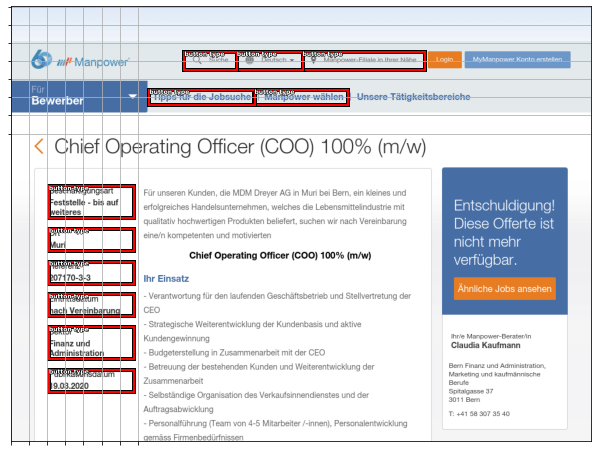

In [103]:
draw_idx(25866, cls=cats_reverse["list element"], with_filter=True)

In [104]:
bounds = get_element_bounds(25866, cats_reverse["list element"])

25496


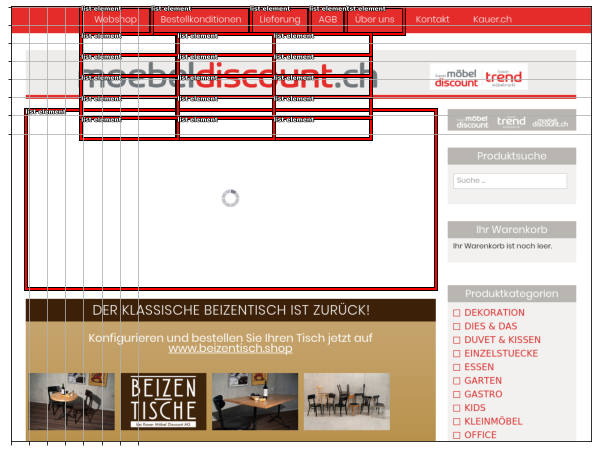

In [120]:
draw_certain_class(cats_reverse["list element"])

In [342]:
urls[4691]

{'url': 'https://stop-the-water-while-using-me.com/de/about/',
 '_type': 'dict',
 'keyword': 'while'}

26426
188 0.8988608374384236
249 0.8267299107142857
169 0.9121492346938775
238 0.8520275297619048
206 0.8997130102040817
202 0.8850859788359788
217 0.8635912698412699
222 0.8353365384615384
203 0.8601190476190477
188 0.8894230769230769
196 0.8999669312169312
498 0.873524678111588
138 0.77248322147651
145 0.8035714285714286
124 0.8261904761904761
83 0.8578651685393258
24 0.6526315789473685
207 0.8796455117209834
210 0.9051326032458108
146 0.8635849056603774
171 0.9177755710029791
177 0.9129305868097628
127 0.8141176470588235
168 0.7738336713995944
120 0.796188898094449


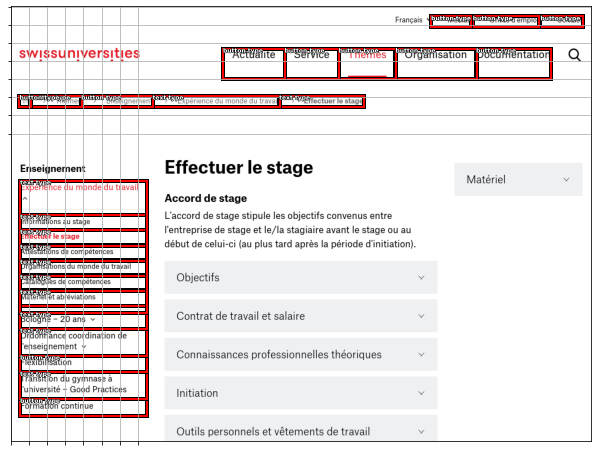

In [343]:
draw_random_list_elements()

# A Elements

In [75]:
def filter_a_bound(idx, a_bound):
    num_words = get_num_words(idx, a_bound, see_results=False)
    
    if num_words < 3:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["button type"]]
    else:
        return [a_bound[0][0], a_bound[0][1], a_bound[0][2], a_bound[0][3], cats_reverse["text type"]]

124 0.8852941176470588
801 0.6040777619724989
> <ipython-input-99-5ed4e0c13f04>(9)draw_idx()
-> im = open_image(jpgs / trn_fns[idx]) # trn_fns is training image file names
(Pdb) continue


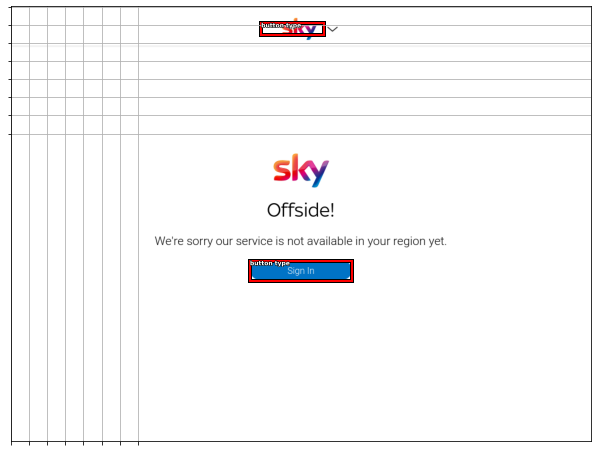

In [101]:
draw_idx(26418, cls=cats_reverse["a"], with_filter=True)

# Non Visible Text

25833
(768, 1024, 3)


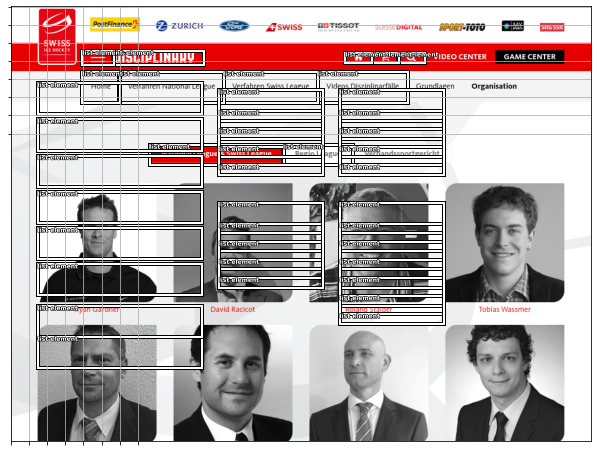

In [497]:
draw_certain_class(cats_reverse["list element"])
#https://www.sihf.ch/de/disciplinary/organisation/?view=desktop#/members/einzelrichter-nl-sl

In [30]:
ents = {'1': {'coords': [{'bottom': 102, 'height': 24, 'top': 78, 'width': 55, 'right': 181, 'left': 126}]}, '2': {'coords': []}, '3': {'coords': []}, '4': {'coords': []}, '5': {'coords': []}, '6': {'coords': []}, '7': {'coords': []}, '8': {'coords': [{'bottom': 277, 'height': 32, 'top': 245, 'width': 234.515625, 'right': 480.46875, 'left': 245.953125}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 110.1875, 'right': 908.40625, 'left': 798.21875}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 98.0625, 'right': 798.21875, 'left': 700.15625}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 158.265625, 'right': 700.15625, 'left': 541.890625}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 166.203125, 'right': 541.890625, 'left': 375.6875}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 184.203125, 'right': 375.6875, 'left': 191.484375}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 65.484375, 'right': 191.484375, 'left': 126}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 121.921875, 'right': 977, 'left': 855.078125}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 124.640625, 'right': 855.078125, 'left': 730.4375}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 730.4375, 'left': 683.734375}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 683.734375, 'left': 637.03125}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 637.03125, 'left': 590.328125}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 158.140625, 'right': 339.140625, 'left': 181}, {'bottom': 115, 'height': 50, 'top': 65, 'width': 69, 'right': 116, 'left': 47}, {'bottom': 45, 'height': 15, 'top': 30, 'width': 43, 'right': 977, 'left': 934}, {'bottom': 45, 'height': 20, 'top': 25, 'width': 40, 'right': 905.75, 'left': 865.75}, {'bottom': 45, 'height': 15, 'top': 30, 'width': 83, 'right': 837.5, 'left': 754.5}, {'bottom': 45, 'height': 15, 'top': 30, 'width': 83, 'right': 726.25, 'left': 643.25}, {'bottom': 45, 'height': 15, 'top': 30, 'width': 73, 'right': 615, 'left': 542}, {'bottom': 45, 'height': 15, 'top': 30, 'width': 65, 'right': 513.75, 'left': 448.75}, {'bottom': 45, 'height': 20, 'top': 25, 'width': 53, 'right': 420.5, 'left': 367.5}, {'bottom': 45, 'height': 20, 'top': 25, 'width': 83, 'right': 339.25, 'left': 256.25}, {'bottom': 45, 'height': 25, 'top': 20, 'width': 88, 'right': 228, 'left': 140}]}, '9': {'coords': [{'bottom': 104, 'height': 101, 'top': 3, 'width': 69, 'right': 116, 'left': 47}]}, '10': {'coords': []}, '11': {'coords': []}, '12': {'coords': []}, '13': {'coords': [{'bottom': 244, 'height': 0, 'top': 244, 'width': 532.109375, 'right': 778.0625, 'left': 245.953125}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 851, 'right': 977, 'left': 126}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 246.5625, 'right': 977, 'left': 730.4375}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 140.109375, 'right': 730.4375, 'left': 590.328125}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 464.328125, 'right': 590.328125, 'left': 126}]}, '14': {'coords': [{'bottom': 278, 'height': 34, 'top': 244, 'width': 236.515625, 'right': 481.46875, 'left': 244.953125}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 110.1875, 'right': 908.40625, 'left': 798.21875}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 98.0625, 'right': 798.21875, 'left': 700.15625}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 158.265625, 'right': 700.15625, 'left': 541.890625}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 166.203125, 'right': 541.890625, 'left': 375.6875}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 184.203125, 'right': 375.6875, 'left': 191.484375}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 65.484375, 'right': 191.484375, 'left': 126}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 121.921875, 'right': 977, 'left': 855.078125}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 124.640625, 'right': 855.078125, 'left': 730.4375}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 730.4375, 'left': 683.734375}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 683.734375, 'left': 637.03125}, {'bottom': 99, 'height': 18, 'top': 81, 'width': 46.703125, 'right': 637.03125, 'left': 590.328125}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 158.140625, 'right': 339.140625, 'left': 181}, {'bottom': 102, 'height': 24, 'top': 78, 'width': 55, 'right': 181, 'left': 126}]}, '15': {'coords': [{'bottom': 863, 'height': 110, 'top': 753, 'width': 289.984375, 'right': 976.984375, 'left': 687}, {'bottom': 983, 'height': 230, 'top': 753, 'width': 319.984375, 'right': 991.984375, 'left': 672}, {'bottom': 983, 'height': 230, 'top': 753, 'width': 640, 'right': 672, 'left': 32}, {'bottom': 983, 'height': 230, 'top': 753, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 983, 'height': 230, 'top': 753, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 523, 'height': 160, 'top': 363, 'width': 768, 'right': 896, 'left': 128}, {'bottom': 543, 'height': 200, 'top': 343, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 543, 'height': 200, 'top': 343, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 613, 'height': 300, 'top': 313, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 613, 'height': 300, 'top': 313, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 648, 'height': 370, 'top': 278, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 648, 'height': 370, 'top': 278, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 283, 'height': 44, 'top': 239, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 648, 'height': 404, 'top': 244, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 688, 'height': 484, 'top': 204, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 157, 'height': 30, 'top': 127, 'width': 69, 'right': 116, 'left': 47}, {'bottom': 169, 'height': 54, 'top': 115, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 115, 'height': 50, 'top': 65, 'width': 69, 'right': 116, 'left': 47}, {'bottom': 115, 'height': 50, 'top': 65, 'width': 960, 'right': 992, 'left': 32}, {'bottom': 65, 'height': 65, 'top': 0, 'width': 837, 'right': 977, 'left': 140}, {'bottom': 65, 'height': 65, 'top': 0, 'width': 960, 'right': 992, 'left': 32}]}, '16': {'coords': []}}


In [31]:
processed_ents = process_ents(ents)
len(processed_ents)

58

(768, 1024, 3)


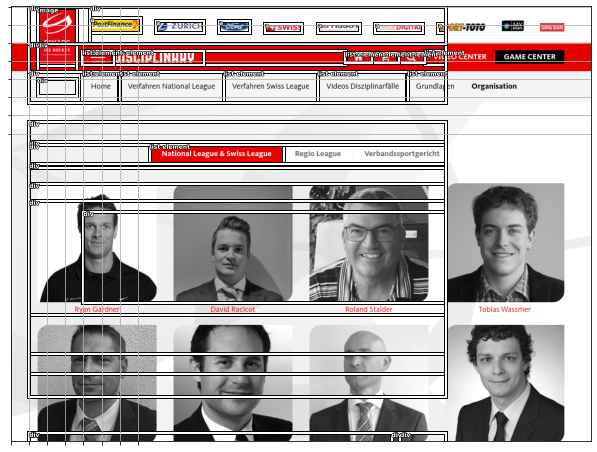

In [32]:
draw_idx(25833, ents=processed_ents)

26703
(768, 1024, 3)


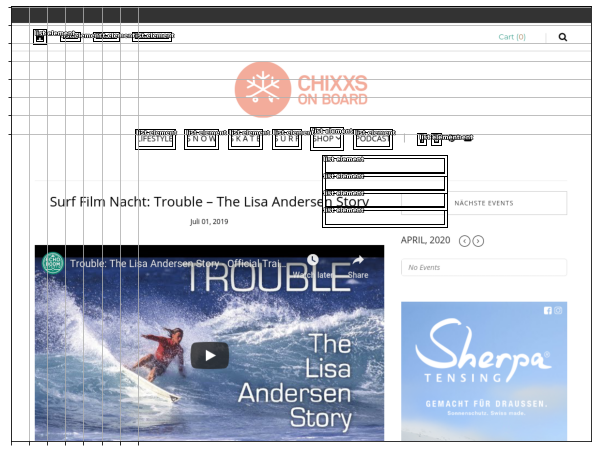

In [494]:
#dropdowns that don't get expanded https://chixxsonboard.ch/surf-film-nacht-trouble-the-lisa-andersen-story/
draw_certain_class(cats_reverse["list element"])

In [59]:
processed_ents = process_ents(ents)
len(processed_ents)

211

(768, 1024, 3)


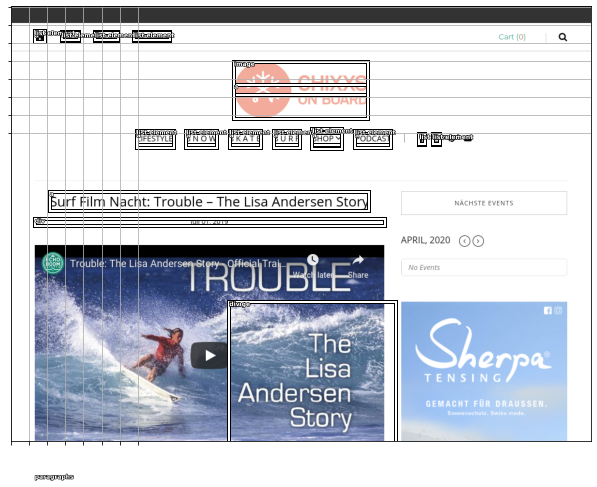

In [32]:
draw_idx(26703, ents=processed_ents)

13219


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


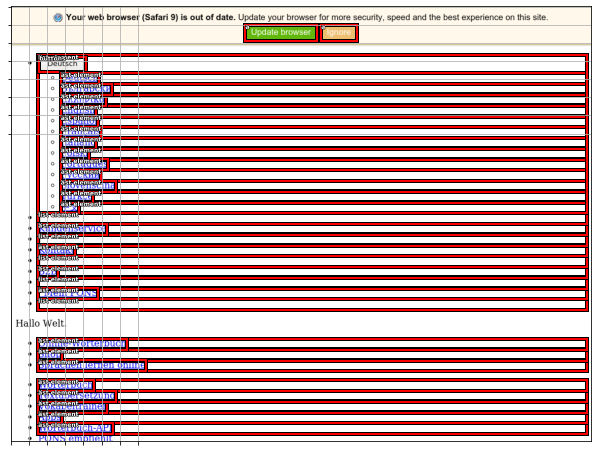

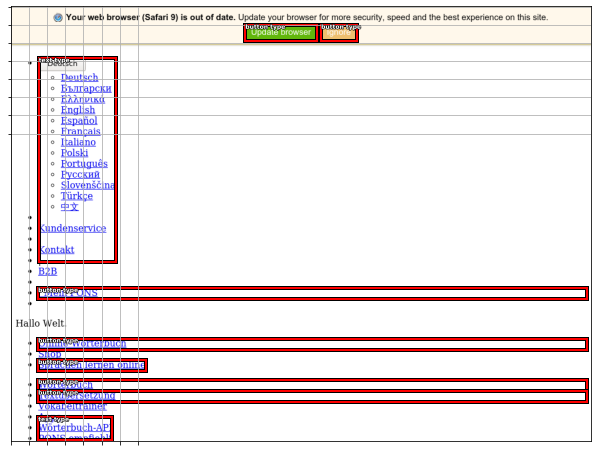

In [266]:
draw_before_after_random()

14183
INPUT: [288.828125, 386.0, 328.828125, 844.0, 19]
INPUT: [379.828125, 386.0, 419.828125, 844.0, 19]


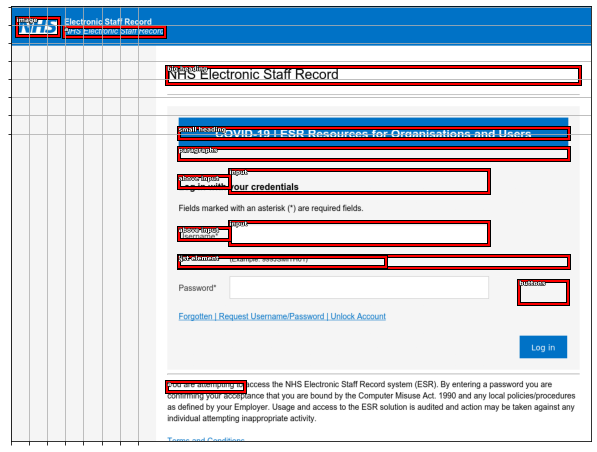

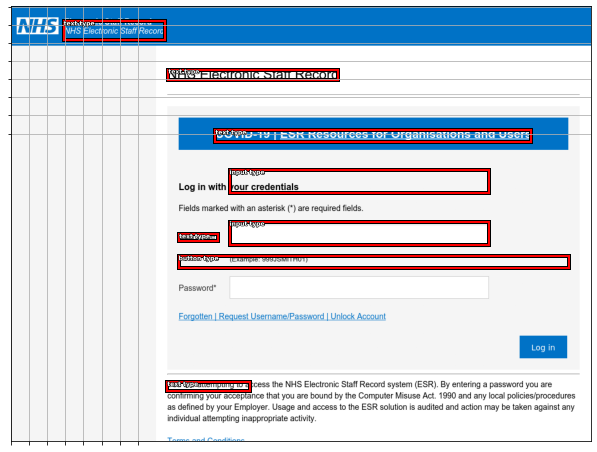

In [265]:
draw_before_after_random()

31026


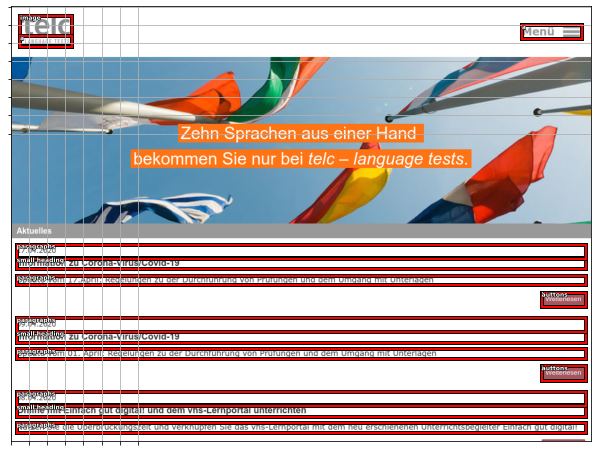

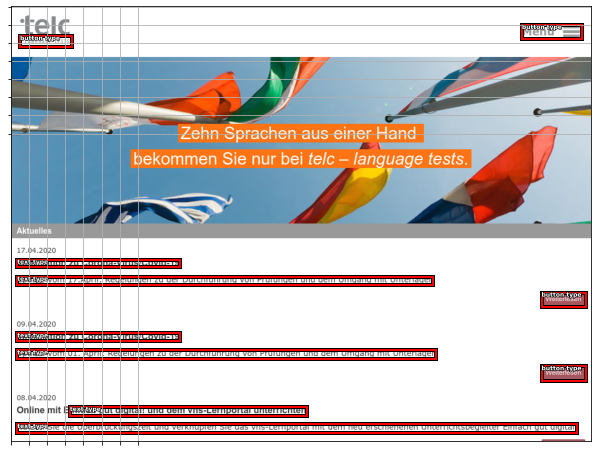

In [267]:
draw_before_after_random()

18524


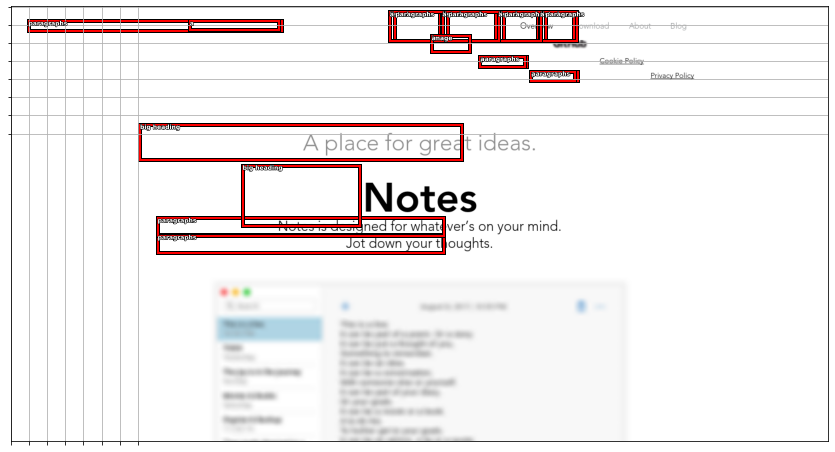

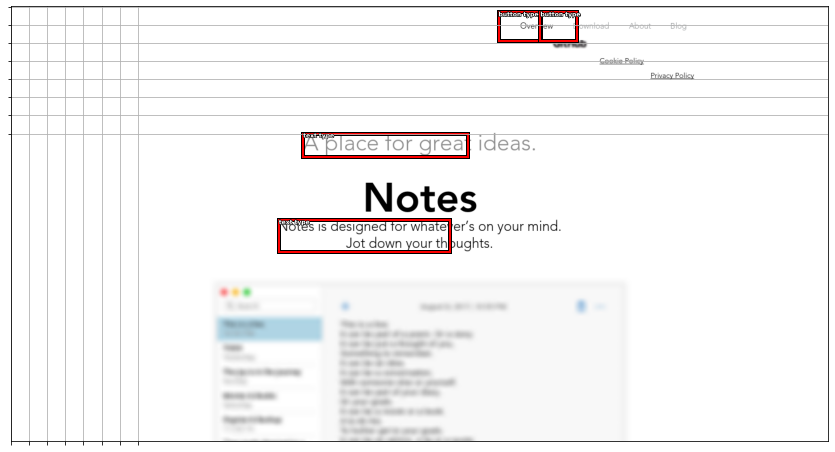

In [268]:
draw_before_after_random()

65136
INPUT: [9.0, 274.40625, 55.0, 745.34375, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


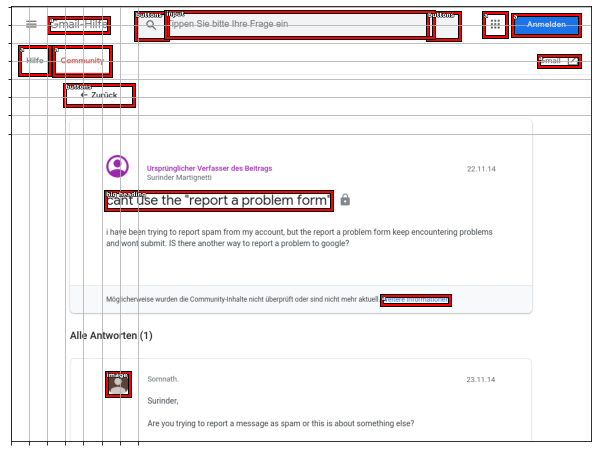

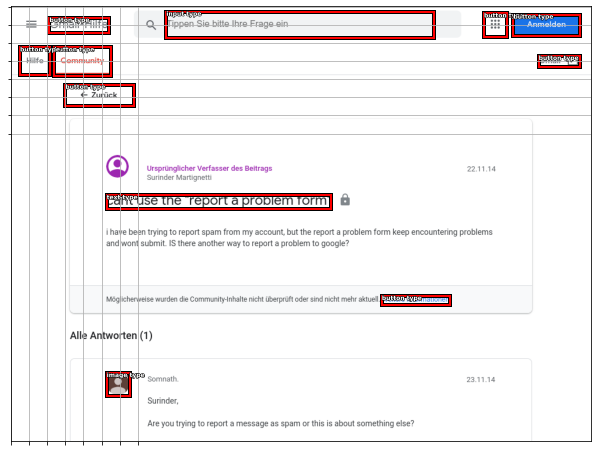

In [269]:
draw_before_after_random()

47248
INPUT: [169, 802, 199, 992, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


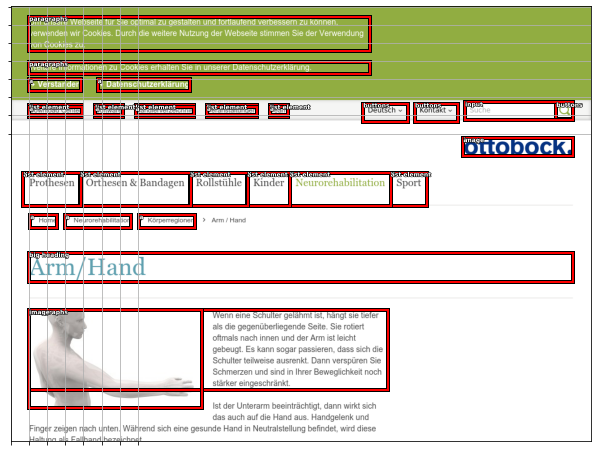

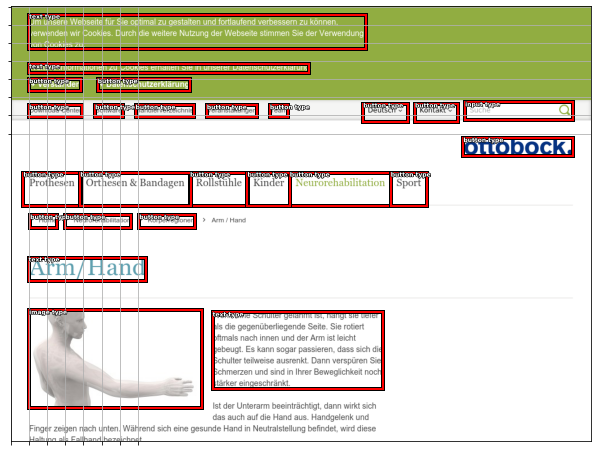

In [270]:
draw_before_after_random()

46790
INPUT: [221, 771, 242, 899, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


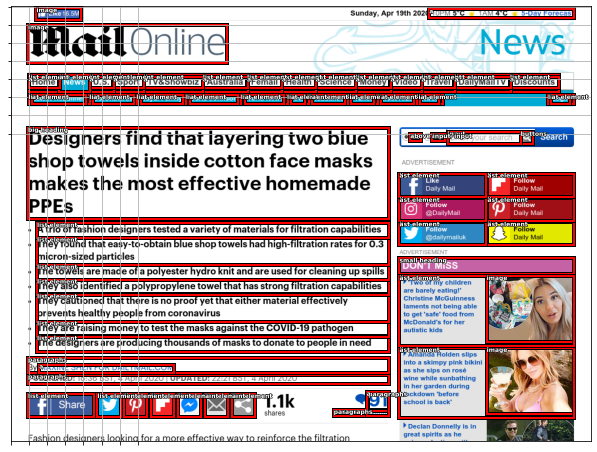

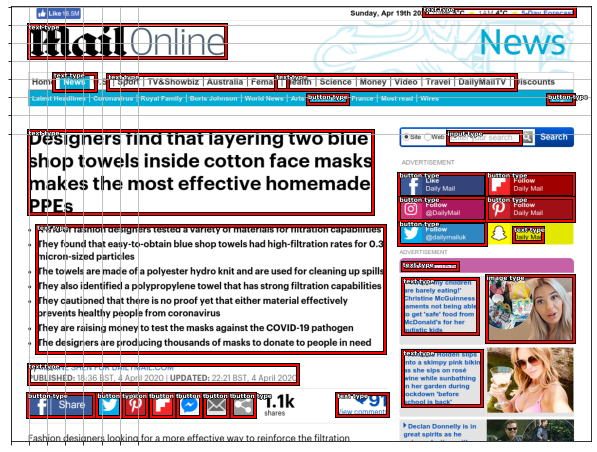

In [271]:
draw_before_after_random()

19342


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


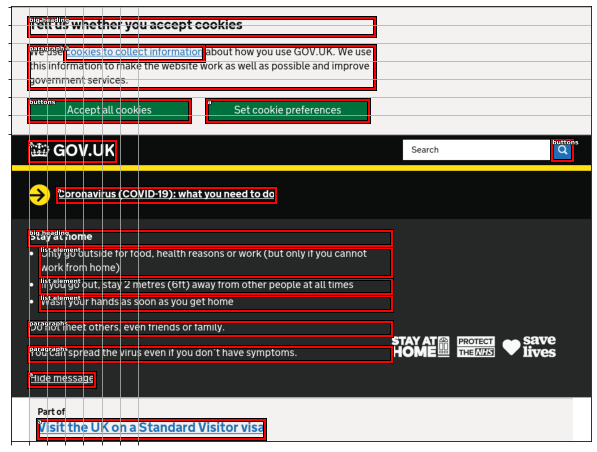

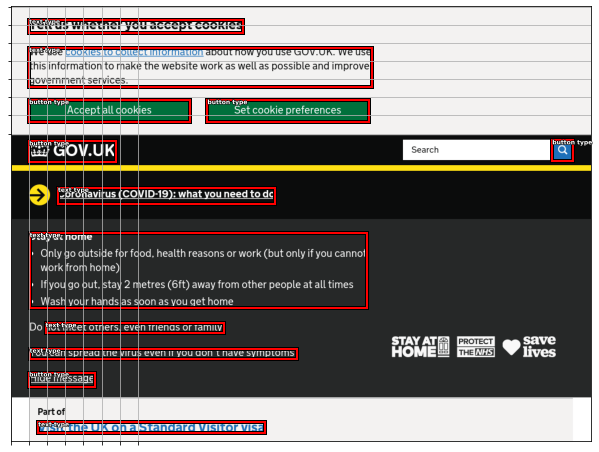

In [272]:
draw_before_after_random()

30492


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


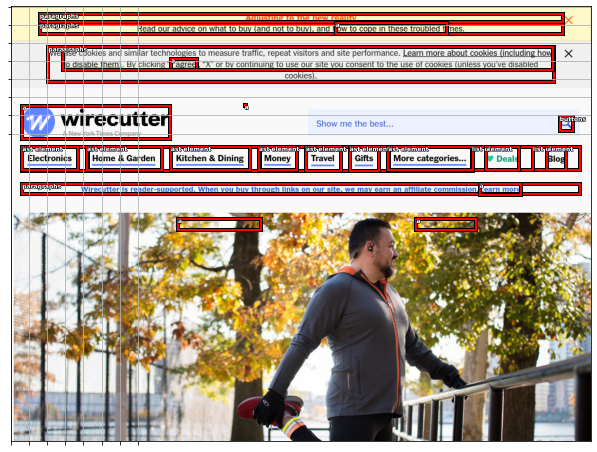

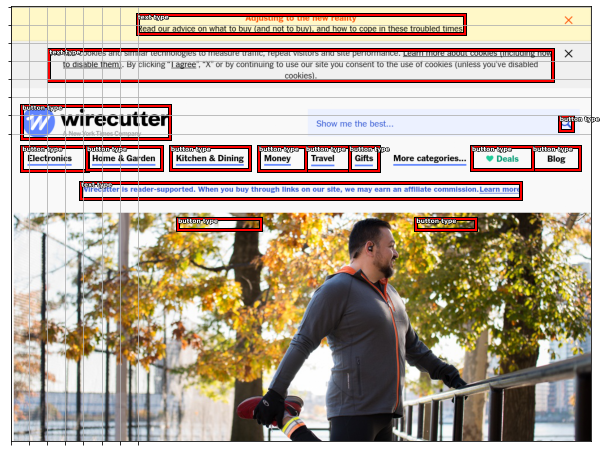

In [273]:
draw_before_after_random()

62659


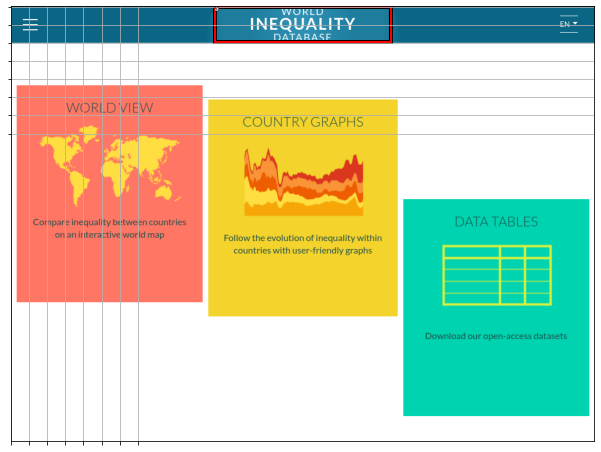

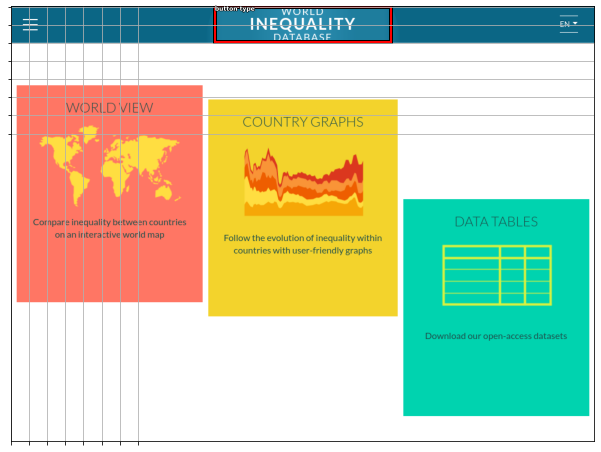

In [274]:
draw_before_after_random()

46094


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


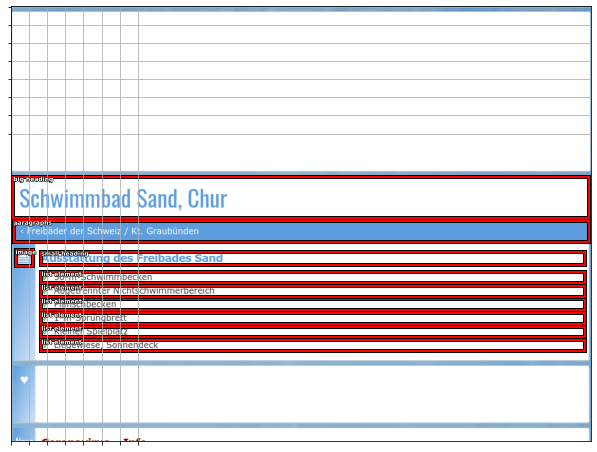

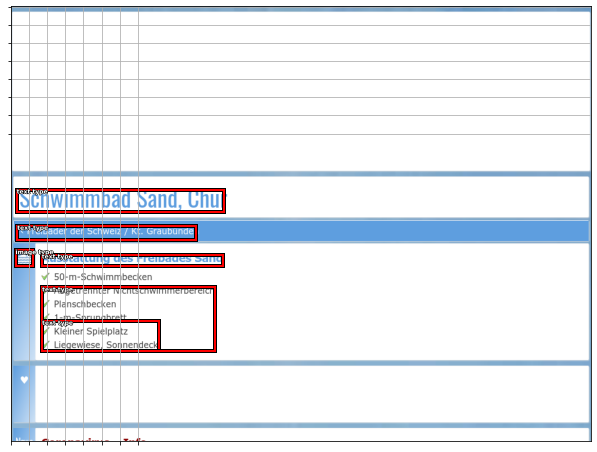

In [275]:
draw_before_after_random()

21996
INPUT: [10, 680, 50, 820, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


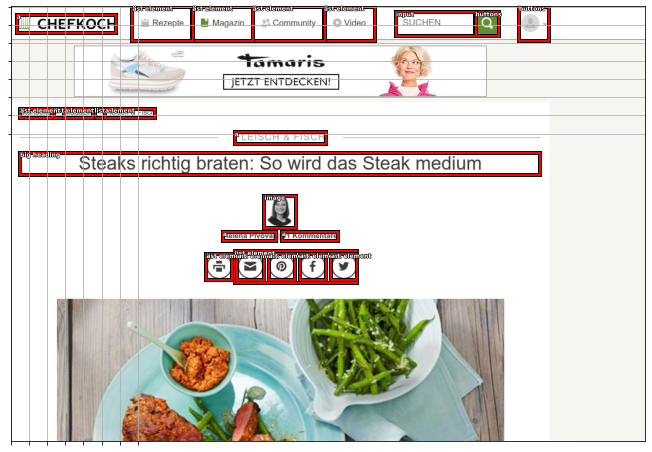

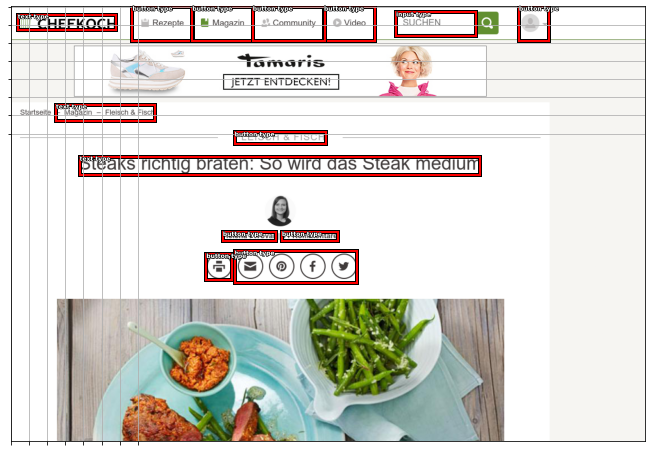

In [276]:
draw_before_after_random()

43562
INPUT: [66.0, 553.0, 94.0, 935.875, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


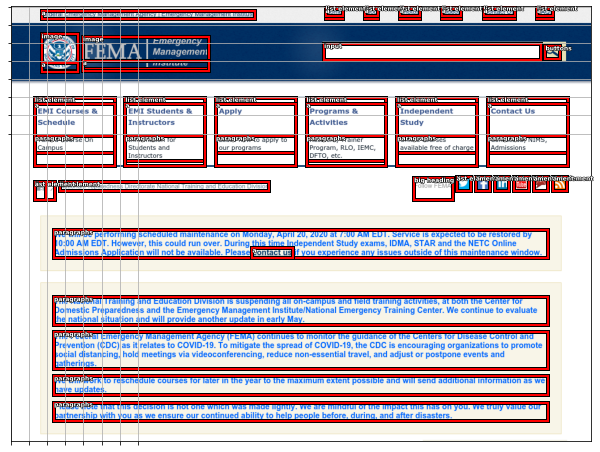

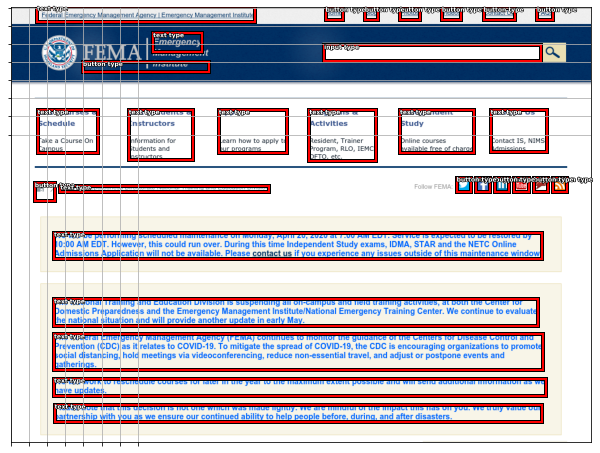

In [277]:
draw_before_after_random()

10281
INPUT: [20, 161, 40, 734, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


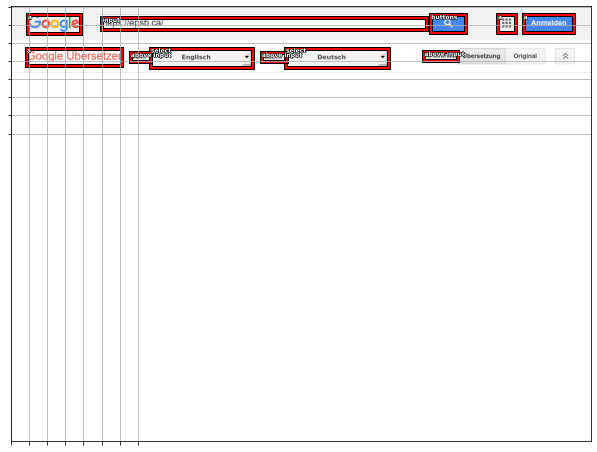

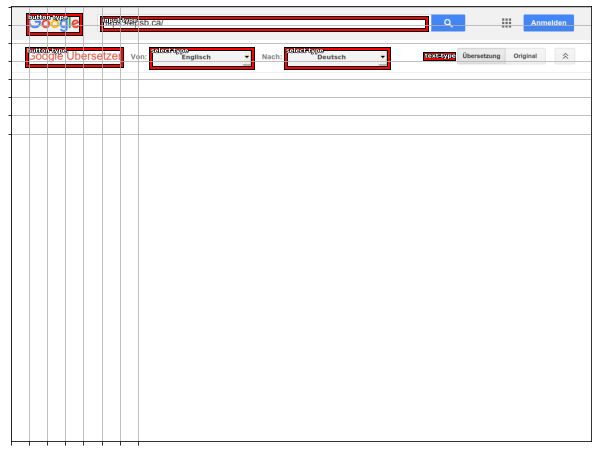

In [278]:
draw_before_after_random()

23143


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


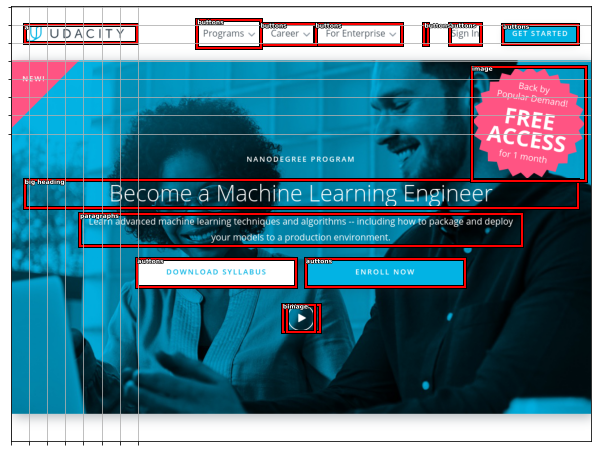

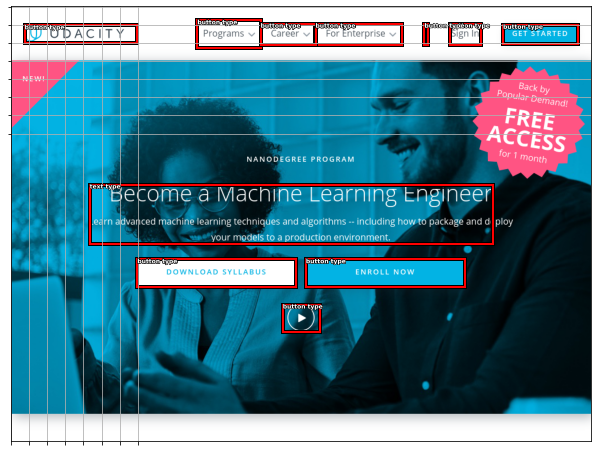

In [279]:
draw_before_after_random()

66266


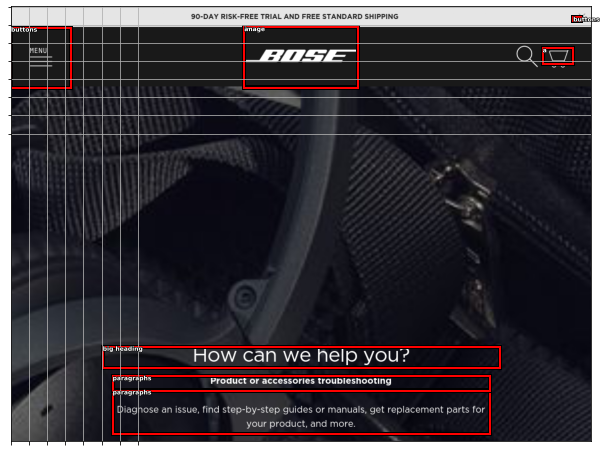

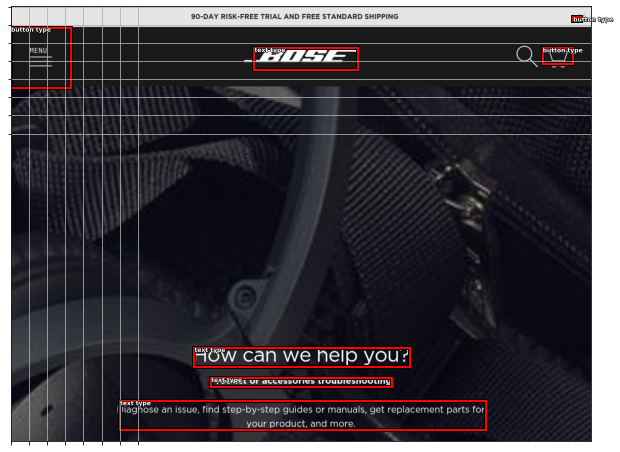

In [280]:
draw_before_after_random()

35302


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


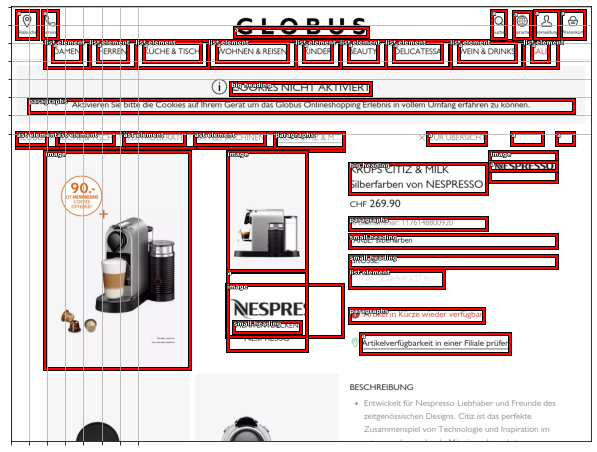

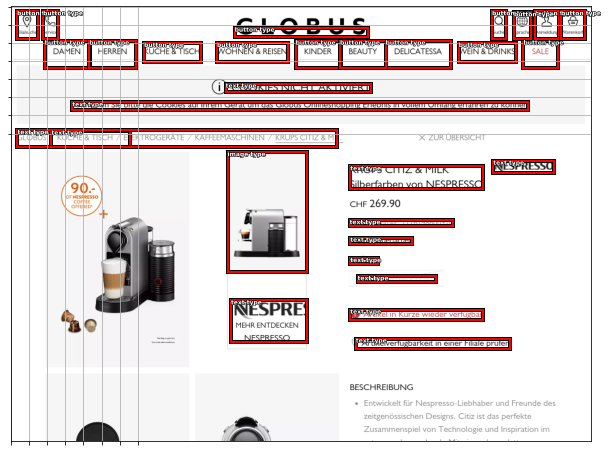

In [281]:
draw_before_after_random()

28228


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


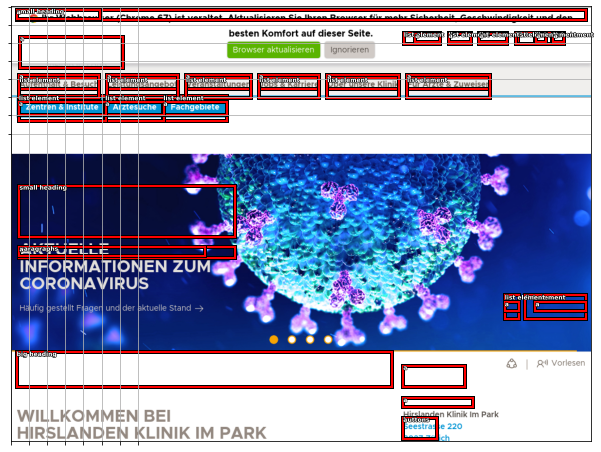

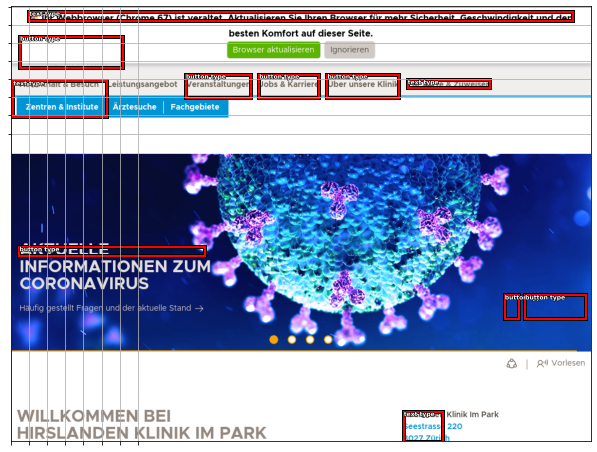

In [282]:
draw_before_after_random()

10998
INPUT: [65.796875, 779.296875, 99.796875, 972.203125, 19]
INPUT: [225.171875, 779.296875, 259.171875, 972.203125, 19]
INPUT: [103.984375, 779.296875, 137.984375, 972.203125, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


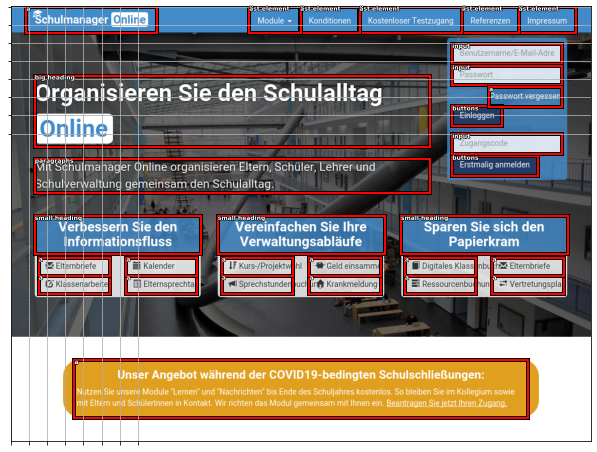

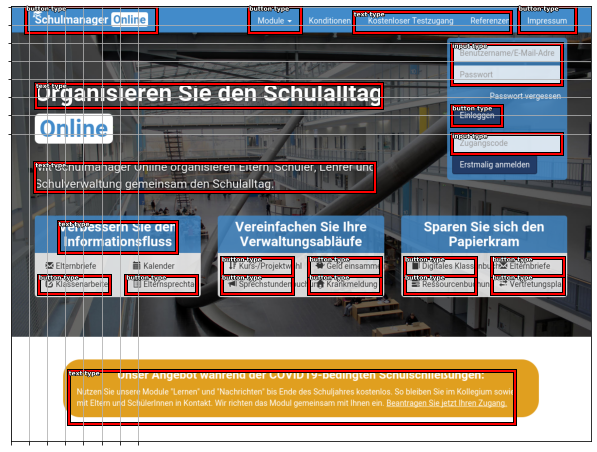

In [283]:
draw_before_after_random()

49748


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


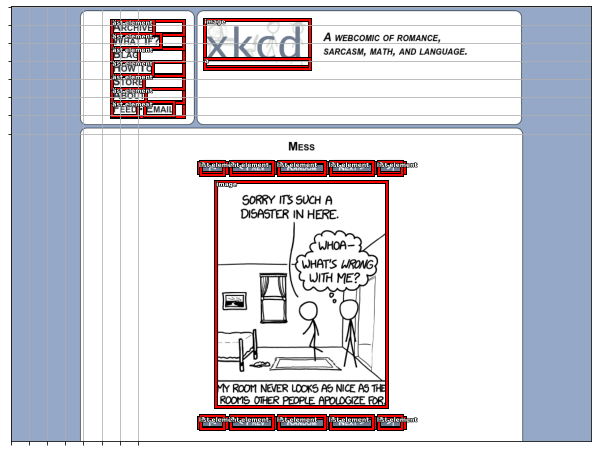

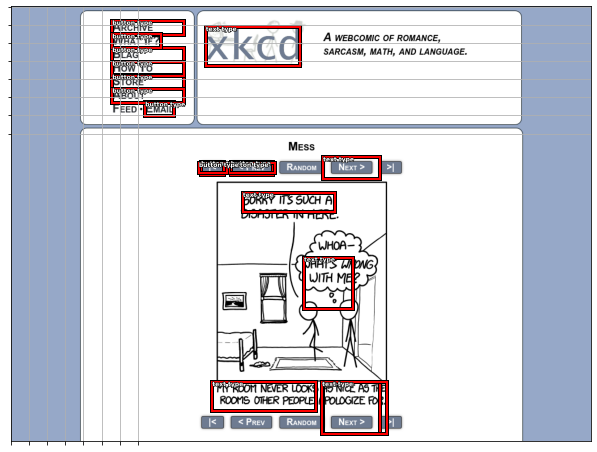

In [284]:
draw_before_after_random()

28883
INPUT: [58.0, 557.71875, 78.0, 877.71875, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


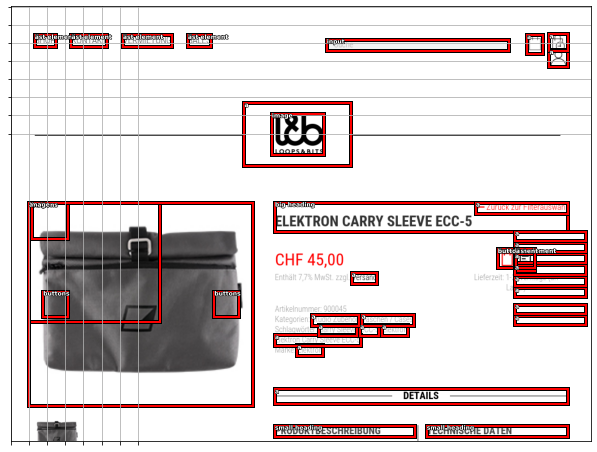

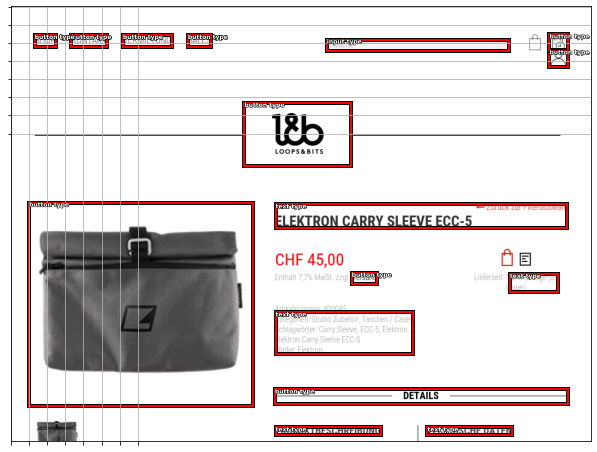

In [285]:
draw_before_after_random()

24345
INPUT: [372.0, 266.640625, 413.0, 396.640625, 19]
INPUT: [238.0, 266.640625, 279.0, 396.640625, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


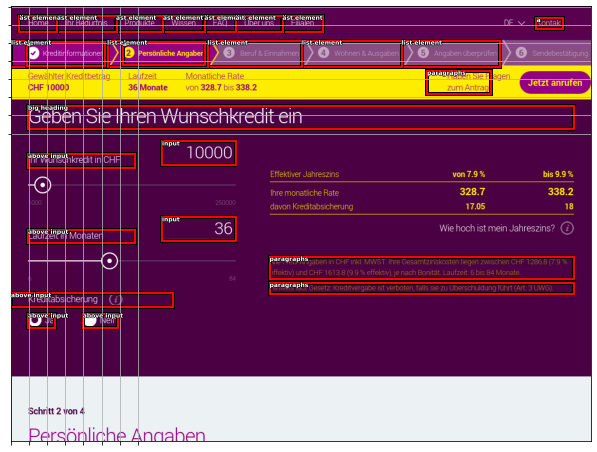

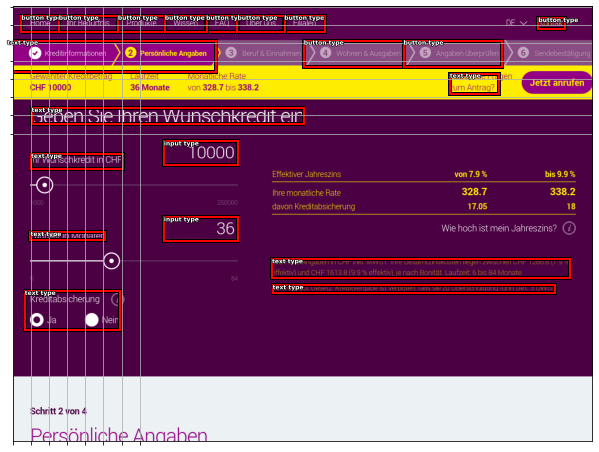

In [286]:
draw_before_after_random()

40050


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


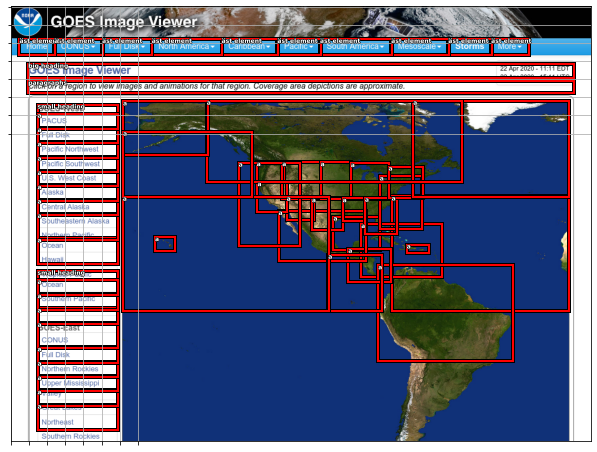

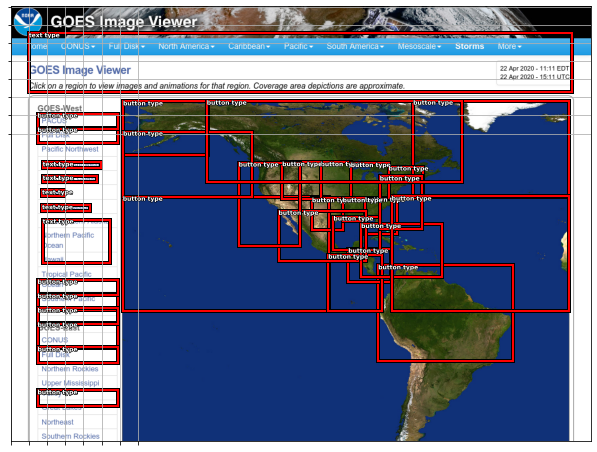

In [287]:
draw_before_after_random()

57806
INPUT: [7, 876, 29, 892, 19]


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


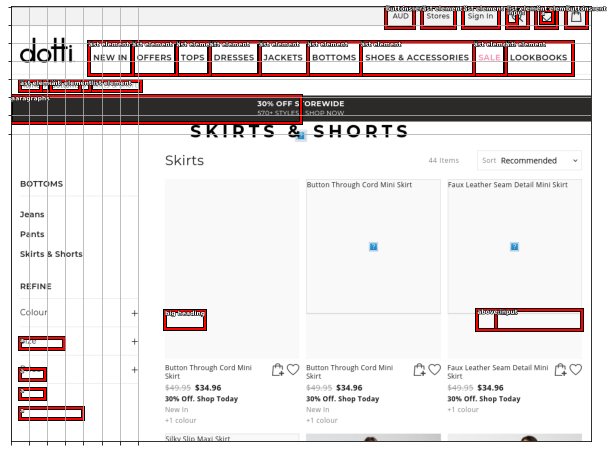

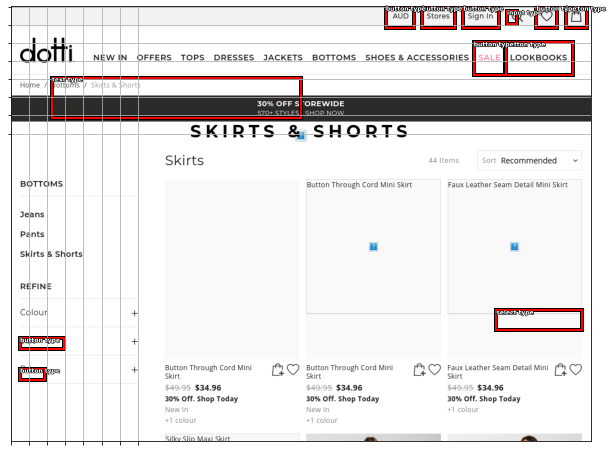

In [288]:
draw_before_after_random()

32395
INPUT: [84.0, 378.875, 124.0, 983.984375, 19]


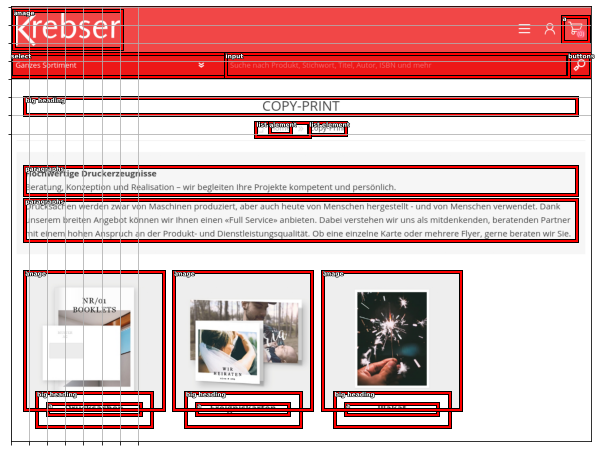

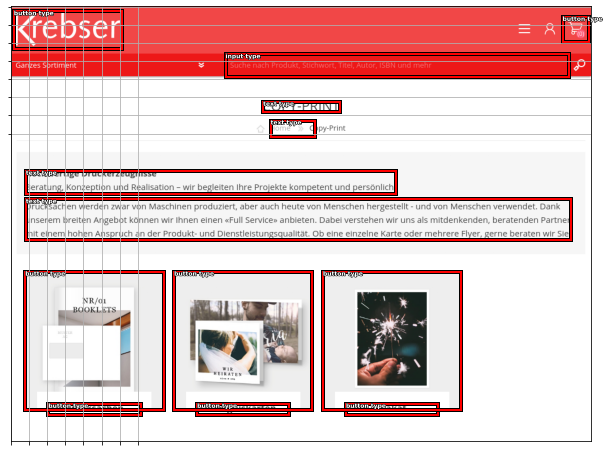

In [289]:
draw_before_after_random()

15146


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.


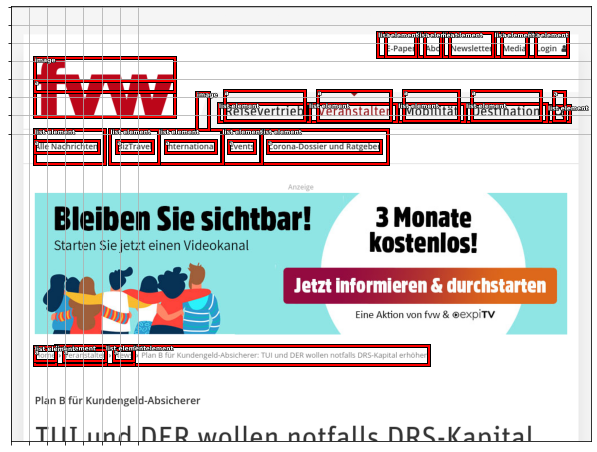

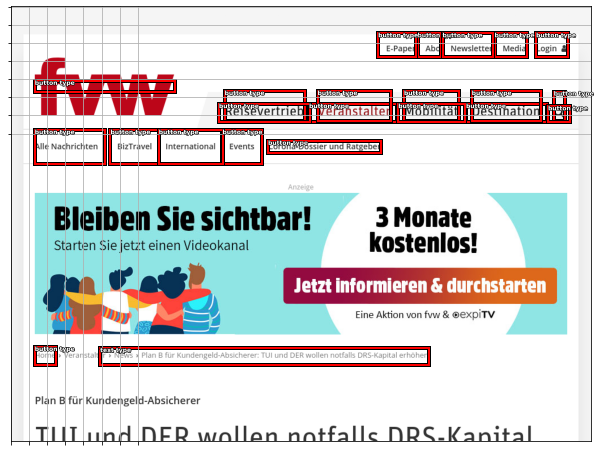

In [290]:
draw_before_after_random()

27104


/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:166: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:139: RuntimeWarning: invalid value encountered in true_divide
/Users/bradleybrown/Desktop/COCOUI/create/lib/python3.7/site-packages/ipykernel_launcher.py:142: RuntimeWarning: invalid value encountered in greater


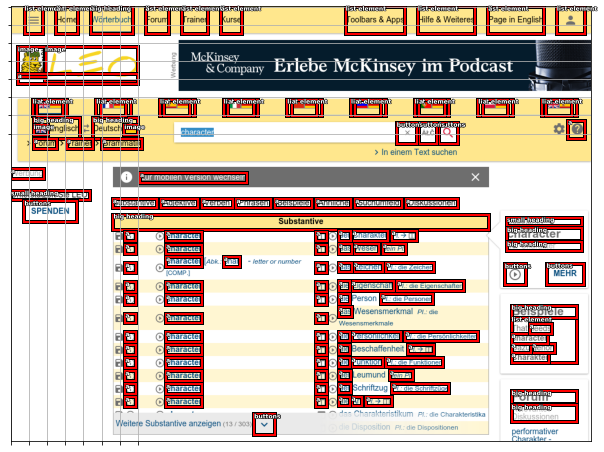

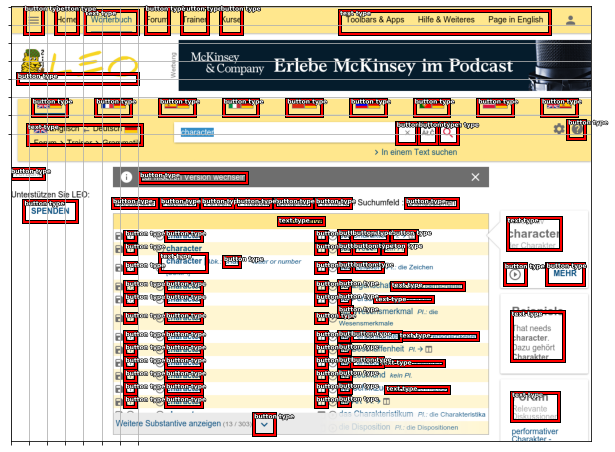

In [291]:
draw_before_after_random()